In [1]:
import pandas as pd
import numpy as np
from numpy import newaxis
import matplotlib.pyplot as plt
import random
import seaborn as sns
import itertools
import os
from PIL import Image
import math
from matplotlib import gridspec
import matplotlib.collections
from glob import glob
from keras.applications import *
import lightgbm as lgbm
import scipy
import tensorflow


from matplotlib.transforms import Affine2D
import mpl_toolkits.axisartist.floating_axes as floating_axes
import matplotlib.collections

from sklearn.model_selection import *

from tqdm import *

import astrohack
from astrohack import *
# nice progress bars otherwise
# def tqdm(x):
#     yield x
plt.ion()
plt.show()

Using TensorFlow backend.


## data folder set up and test

In [2]:
astrohack.dataFolder = 'data/mainData_original/'
plt.ion()

runNameParams = []
runNameParams.append('newSource')
# print(runNameParams)

### Read metadata file

In [3]:
df =  getAstrohackDataFrame()
df.head()


,SDSS_ID,RA,DEC,D25,redshi,GalSize_kpc,D_Mpc,d_pix_kpc,ML_g,ML_i,ML_g_rel_err,ML_i_rel_err,logMstar,err_logMstar,Distance,lin_mass,lin_err,hasFile
174,1237662301367173202,231.31860,41.34601,0.512861,0.0761,48.655727,326.142854,0.632474,2.472975,2.279201,0.105385,0.10490392881262686,10.325,0.045,326.142854,2.113489e+10,2.189920e+09,True
216,1237662301905813735,236.00985,39.28830,0.446684,0.0685,38.145197,293.571417,0.569310,0.841365,1.148099,0.093758,0.09498951605786418,9.824,0.040,293.571417,6.668068e+09,6.141517e+08,True
237,1237662534360301834,237.49500,9.27861,0.630957,0.0390,30.677076,167.142861,0.324133,0.703785,1.051369,0.122754,0.12327084107474802,9.923,0.053,167.142861,8.375293e+09,1.022096e+09,True
276,1237662500543987740,242.00880,36.05398,0.562341,0.0658,46.129129,282.000016,0.546870,1.248502,1.269311,0.183377,0.1837691489095808,10.356,0.079,282.000016,2.269865e+10,4.128980e+09,True
332,1237662474232398001,246.28905,29.94774,0.446684,0.0455,25.337321,194.999996,0.378155,0.419816,0.559744,0.219920,0.2194701990290622,9.234,0.094,194.999996,1.713957e+09,3.709741e+08,True


### Filter images that have no known mass, no actual image, or with an unknown error

In [4]:
# X = read_image(1237662500543987740)
# plt.imshow(img_preproclist(X, [PP_HACKATON,0]))
# plt.figure()
# plt.imshow(img_preproclist(X, [PP_LOG1P,PP_HACKATON, 0]))
# plt.figure()
# plt.imshow(img_preproclist(X, [PP_SCALE,PP_LOG1P,PP_HACKATON, 0]))
# plt.figure()
# plt.imshow(img_preproclist(X, [PP_SCALE,PP_NORMALIZE,PP_LOG1P,PP_HACKATON, 0]))


In [5]:
vgg16 = None
r50 = None
cnn = None

In [6]:

runNameParams.append('ReadLog1pNormCrop.75origOldCleanup')

postImgFeatureNames = ['norm.flux.sum', 'norm.flux.min',
                       'norm.flux.max', 'norm.flux.mean', 
                       'norm.flux.std', 'center.flux', 
                       'aroundCenter.flux']
preImgFeatureNames = ['pre.flux.sum', 'pre.flux.min', 
                      'pre.flux.max', 'pre.flux.mean',
                      'pre.flux.std', 'pre.center.flux',
                      'pre.aroundCenter.flux', 'width']
distanceNames = ['D', '1/D', 'D**2', '1/D**2', 'D**3', '1/D**3', 'log(D)', '1/log(D)', 'log(D**2)', 'log(1/D**2)', 'log(D)**2', '1/log(D)**2' ]
numFeatures = 0

def getFeatures(preprocessingList):
    global vgg16, r50, cnn,numFeatures
    
    if vgg16 == None:
        vgg16 = VGG16(weights='imagenet',include_top=True,input_shape=(224,224,3))
    if r50 == None:
        r50 = ResNet50(weights='imagenet',include_top=False,input_shape=(224,224,3))
#     if cnn == None:
#         cnn = load_model('encoder.h5')
    Xg3r50 = []
    Xg3vgg16 = []
    postImgFeatures = []
    csize=2
    preImgFeatures = []
    cnnFeatures = []

    maxChunkNumber = math.ceil(len(ids)/chunkSize)
    chunkStart = 0
    # for chunkStart in tqdm(range(0, 3)):
    
    # do the loading by chunk to avoid consuming too much memory
    for chunkStart in tqdm(range(0, len(ids), chunkSize)):
        curChunk = int((chunkStart//chunkSize))
        valuesInThisChunk = min(chunkStart+chunkSize,len(ids))-chunkStart

        Xg_ = []
        pre_ex_ = []

        # preprocess the image and collect some raw image stats
        for i in range(chunkStart, chunkStart+valuesInThisChunk):
            X = read_image(ids[i])
            Xg_.append(img_preproclist(X, preprocessingList))
            pre_ex_.append([
                X.sum(),
                X.min(),
                X.max(),
                X.mean(),
                X.std(),
                X[X.shape[0]//2,X.shape[1]//2],
                np.mean(X[X.shape[0]//2-csize:X.shape[0]//2+csize,X.shape[1]//2-csize:X.shape[1]//2+csize]), # mean center
                X.shape[0], 
            ])

        # stack the postprocessing
        pre_ex = np.stack(pre_ex_)
        Xg = np.stack(Xg_)

        # collect some post processing stats
        post_ex = np.hstack([
            np.sum(Xg.reshape(valuesInThisChunk,-1),axis=1).reshape(valuesInThisChunk,1),
            np.min(Xg.reshape(valuesInThisChunk,-1),axis=1).reshape(valuesInThisChunk,1),
            np.max(Xg.reshape(valuesInThisChunk,-1),axis=1).reshape(valuesInThisChunk,1),
            np.mean(Xg.reshape(valuesInThisChunk,-1),axis=1).reshape(valuesInThisChunk,1),
            np.std(Xg.reshape(valuesInThisChunk,-1),axis=1).reshape(valuesInThisChunk,1),
            Xg[:,112,112].reshape(valuesInThisChunk,1),       # center
            np.mean(Xg[:,112-csize:112+csize,112-csize:112+csize].reshape(valuesInThisChunk,-1),axis=1).reshape(valuesInThisChunk,-1) # mean center
            ])

        
#         cnnFeatures_ = cnn.predict( Xg[:,:,:,newaxis])
#         cnnFeatures_ = cnnFeatures.reshape(valuesInThisChunk, -1)
        
        # prepare correct dimension to feed to imagenet networks
        Xg3 = np.zeros((valuesInThisChunk,224,224,3))
        Xg3[:,:,:,:] = Xg.reshape(valuesInThisChunk,224,224,1)

        # do r50 prediction
        Xg3r50_ = r50.predict(Xg3).reshape(valuesInThisChunk, 2048)
        Xg3vgg16_ = vgg16.predict(Xg3)
        


        if chunkStart == 0:
            Xg3r50 = Xg3r50_
            Xg3vgg16 = Xg3vgg16_
            preImgFeatures = pre_ex
            postImgFeatures = post_ex
#             cnnFeatures = cnnFeatures_
        else:
            Xg3r50 = np.concatenate([Xg3r50,Xg3r50_], axis=0)
            Xg3vgg16 = np.concatenate([Xg3vgg16,Xg3vgg16_], axis=0)
            preImgFeatures = np.concatenate([preImgFeatures,pre_ex], axis=0)
            postImgFeatures = np.concatenate([postImgFeatures,post_ex], axis=0)
#             cnnFeatures = np.concatenate([cnnFeatures, cnnFeatures_], axis = 0)


    # add features from the data itself (distance)
    Distance = df.Distance.values[:N].reshape(N,1)

    Xg3f = np.hstack ( ( 
            Xg3r50, 
            Xg3vgg16, 
#             cnnFeatures,
            Distance,
            1/Distance,
            Distance**2,
            1/(Distance**2),
            Distance**3,
            1/(Distance**3),
            np.log(Distance),
            1/np.log(Distance),
            np.log(Distance**2),
            1/np.log(Distance**2),
            np.log(Distance)**2,
            1/np.log(Distance)**2,
            preImgFeatures,
            postImgFeatures
            ) )


    Xg3fNames = ( [prefixThisRound+'.r50.' + str(i) for i in range(Xg3r50.shape[1])]
                + [prefixThisRound+'.vgg16.' + str(i) for i in range(Xg3vgg16.shape[1])] 
#                 + [prefixThisRound+'.cnn.' + str(i) for i in range(cnnFeatures.shape[1])] 
                + [prefixThisRound+'.'+ n for n in distanceNames]
                + [prefixThisRound+'.'+ n for n in preImgFeatureNames]
                + [prefixThisRound+'.'+ n for n in postImgFeatureNames])
    return Xg3f, Xg3fNames

# numFeatures = 2048 + 1000 + 7*7 *8 + len(postImgFeatureNames) + len(preImgFeatureNames) + len(distanceNames) 
numFeatures = 2048 + 1000 + len(postImgFeatureNames) + len(preImgFeatureNames) + len(distanceNames) 

    

In [7]:
lgbm_params = {
    'boosting_type': 'gbdt',
    'objective': 'regression_l2',
    'nthread': 4,
    #'silent': True,
    'num_leaves': 2**4,
    'learning_rate': 0.01,
    'max_depth': 10,
    'max_bin': 255,
    #'subsample_for_bin': 50000,
    #'subsample': 0.8,
    #'subsample_freq': 1,
    #'colsample_bytree': 0.8,
    #'reg_alpha': 1,
    #'reg_lambda': 0,
    #'min_split_gain': 0.5,
    #'min_child_weight': 1,
    #'min_child_samples': 60,
    #'scale_pos_weight': 1,
    'device' : 'gpu',
    'metric' : 'rmse',
    #'metric' : 'multi_error',
    'verbose':0,
}

In [8]:
TRAIN = 0
TEST = 4

FEATURES = 0
TRUTH = 1
ERROR = 2
LINERROR = 3

ID = 8
FEATURENAMES = 9

data = list(range(10))


In [9]:
# breakqsdqsd

# Iteration parameters defined here:

- N is the number of galaxies to use for this run
- M is the number of galaxies to train set (rest is holdout)
- chunkSize is the number of galaxies to evaluate at once
- prefixThisRound is the model name, for serialization purposes

In [10]:
df = df.sample(frac=1).reset_index()

In [11]:
N = int(len(df.SDSS_ID.values))
M = int(N*.9)

prefixThisRound = 'sp'
for i in runNameParams:
    prefixThisRound = prefixThisRound + '-' + i

prefixThisRound = prefixThisRound + '-model11'
    
chunkSize = 200
nSplits = 7
reloadImagesAndPreprocess = 1
numPreprocessing = 1
nSplits = 1

maxBoostRuns = 30000 # 30000
# N = 3000 # number of galaxies to take into consideration
# M = 2000 # train vs holdout
N = int(N*0.1)
M = int(M*0.1)


# N = int(N*0.01)
# M = int(M*0.01)


In [12]:
df.columns

Index(['index', 'SDSS_ID', 'RA', 'DEC', 'D25', 'redshi', 'GalSize_kpc',
       'D_Mpc', 'd_pix_kpc', 'ML_g', 'ML_i', 'ML_g_rel_err', 'ML_i_rel_err',
       'logMstar', 'err_logMstar', 'Distance', 'lin_mass', 'lin_err',
       'hasFile'],
      dtype='object')

In [13]:
# plt.figure(figsize=(18,8))
# plt.subplot(121)
# plt.xlabel('ML_g')
# plt.ylabel('log(M)')
# sns.kdeplot(x=df.ML_g, y=df.logMstar, alpha=0.2)
# plt.subplot(122)
# plt.hist(x=df.ML_g, bins=100)
# plt.title('ML_g histogram')
# plt.xlabel('ML_g')
# 1

In [14]:
ids = df.SDSS_ID.values[:N]
#Y = df.logMstar.values[:N]
Y = df.ML_g.values[:N]
err = df.ML_g_rel_err.values[:N] * Y
# Y_lin = df.lin_mass.values[:N]
err_lin = df.lin_err.values[:N]

In [15]:
print(N)
print(M)
print(chunkSize)
print(prefixThisRound)

7690
6921
200
sp-newSource-ReadLog1pNormCrop.75origOldCleanup-model11


In [16]:

preProcessingIterations = []
for i in range(5):
    preProcessingIterations = preProcessingIterations + list(itertools.permutations([PP_SCALE,PP_LOG1P,PP_CROP, PP_HACKATON],i))

numPreprocessing = len(preProcessingIterations)

In [17]:
nSplits = 7
astrohack.nSplits = nSplits
astrohack.lgbm_params = lgbm_params
astrohack.maxBoostRuns = maxBoostRuns

100%|██████████| 39/39 [01:57<00:00,  2.72s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.859241	training's Chi²: 77.7	valid_1's rmse: 0.947391	valid_1's Chi²: 95.8
[200]	training's rmse: 0.602245	training's Chi²: 38.2	valid_1's rmse: 0.780012	valid_1's Chi²: 64.9
[300]	training's rmse: 0.51842	training's Chi²: 28.3	valid_1's rmse: 0.739624	valid_1's Chi²: 58.4
[400]	training's rmse: 0.477568	training's Chi²: 24	valid_1's rmse: 0.724273	valid_1's Chi²: 56
[500]	training's rmse: 0.450852	training's Chi²: 21.4	valid_1's rmse: 0.720336	valid_1's Chi²: 55.4
[600]	training's rmse: 0.430181	training's Chi²: 19.5	valid_1's rmse: 0.718401	valid_1's Chi²: 55.1
Early stopping, best iteration is:
[594]	training's rmse: 0.431315	training's Chi²: 19.6	valid_1's rmse: 0.718323	valid_1's Chi²: 55
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.851024	training's Chi²: 77	valid_1's rmse: 1.10728	valid_1's Chi²: 123.5
[200]	training's rmse: 0.605522	training's Chi²:

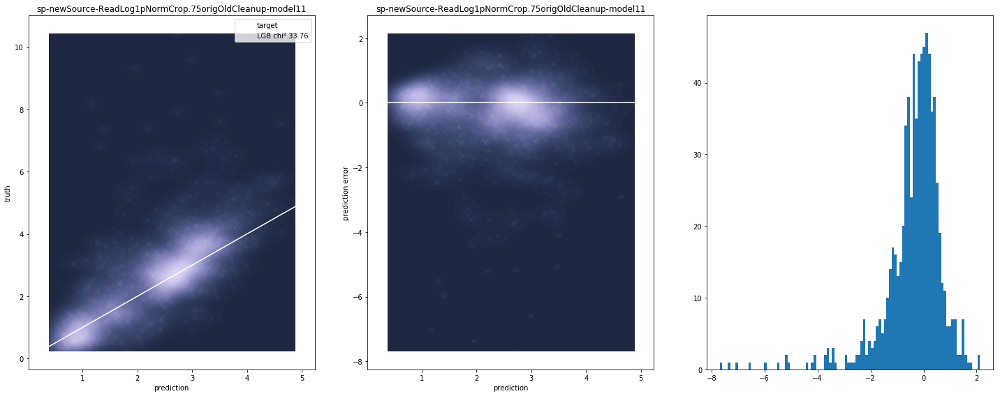

100%|██████████| 39/39 [01:01<00:00,  1.36s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.853928	training's Chi²: 76.8	valid_1's rmse: 0.955525	valid_1's Chi²: 97.4
[200]	training's rmse: 0.593067	training's Chi²: 37	valid_1's rmse: 0.780151	valid_1's Chi²: 64.9
[300]	training's rmse: 0.507713	training's Chi²: 27.1	valid_1's rmse: 0.734623	valid_1's Chi²: 57.6
[400]	training's rmse: 0.467097	training's Chi²: 23	valid_1's rmse: 0.725201	valid_1's Chi²: 56.1
[500]	training's rmse: 0.441495	training's Chi²: 20.5	valid_1's rmse: 0.721587	valid_1's Chi²: 55.5
[600]	training's rmse: 0.421428	training's Chi²: 18.7	valid_1's rmse: 0.721117	valid_1's Chi²: 55.5
Early stopping, best iteration is:
[500]	training's rmse: 0.441495	training's Chi²: 20.5	valid_1's rmse: 0.721587	valid_1's Chi²: 55.5
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.845519	training's Chi²: 76	valid_1's rmse: 1.07738	valid_1's Chi²: 116.9
[200]	training's rmse: 0.596697	training's Ch

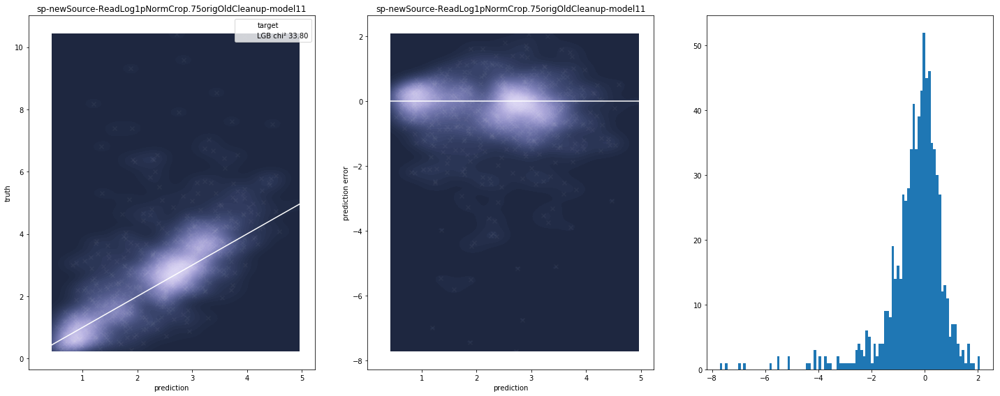

100%|██████████| 39/39 [01:02<00:00,  1.37s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.848044	training's Chi²: 75.7	valid_1's rmse: 0.956404	valid_1's Chi²: 97.6
[200]	training's rmse: 0.588752	training's Chi²: 36.5	valid_1's rmse: 0.779277	valid_1's Chi²: 64.8
[300]	training's rmse: 0.502449	training's Chi²: 26.6	valid_1's rmse: 0.731411	valid_1's Chi²: 57.1
[400]	training's rmse: 0.461363	training's Chi²: 22.4	valid_1's rmse: 0.721548	valid_1's Chi²: 55.5
Early stopping, best iteration is:
[394]	training's rmse: 0.463357	training's Chi²: 22.6	valid_1's rmse: 0.721526	valid_1's Chi²: 55.5
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.839281	training's Chi²: 74.8	valid_1's rmse: 1.09857	valid_1's Chi²: 121.6
[200]	training's rmse: 0.587785	training's Chi²: 36.7	valid_1's rmse: 0.875055	valid_1's Chi²: 77.1
[300]	training's rmse: 0.50339	training's Chi²: 26.9	valid_1's rmse: 0.81682	valid_1's Chi²: 67.2
[400]	training's rmse: 0.462081	training'

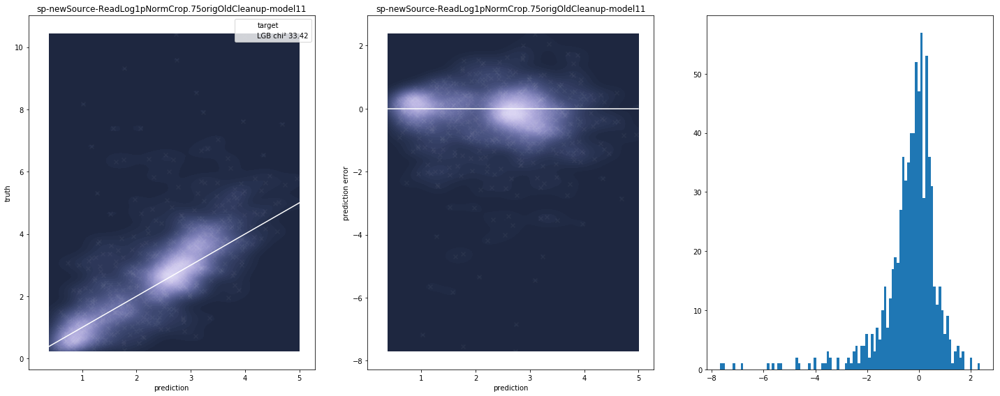

100%|██████████| 39/39 [01:01<00:00,  1.34s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.846423	training's Chi²: 75.4	valid_1's rmse: 0.940645	valid_1's Chi²: 94.4
[200]	training's rmse: 0.587634	training's Chi²: 36.4	valid_1's rmse: 0.768344	valid_1's Chi²: 63
[300]	training's rmse: 0.504563	training's Chi²: 26.8	valid_1's rmse: 0.718241	valid_1's Chi²: 55
[400]	training's rmse: 0.464943	training's Chi²: 22.8	valid_1's rmse: 0.695053	valid_1's Chi²: 51.5
[500]	training's rmse: 0.437978	training's Chi²: 20.2	valid_1's rmse: 0.685693	valid_1's Chi²: 50.2
[600]	training's rmse: 0.417349	training's Chi²: 18.3	valid_1's rmse: 0.685403	valid_1's Chi²: 50.1
Early stopping, best iteration is:
[501]	training's rmse: 0.437739	training's Chi²: 20.2	valid_1's rmse: 0.685463	valid_1's Chi²: 50.1
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.836379	training's Chi²: 74.3	valid_1's rmse: 1.08676	valid_1's Chi²: 119
[200]	training's rmse: 0.586365	training's Ch

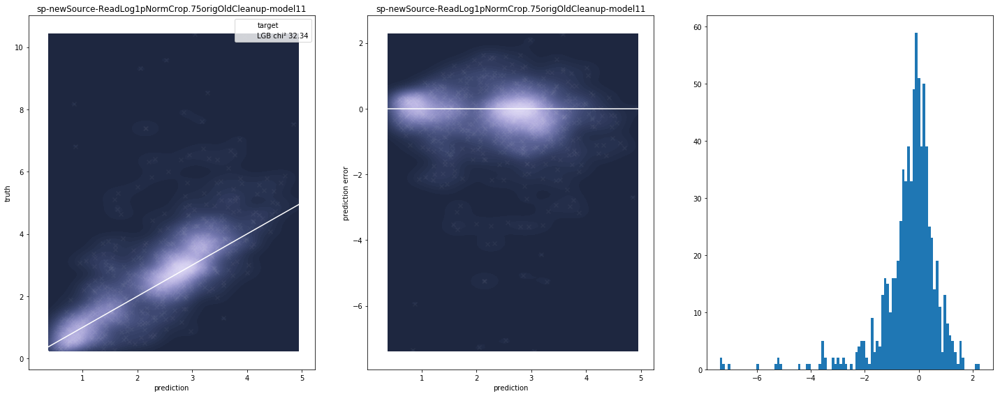

100%|██████████| 39/39 [15:33<00:00, 20.07s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.82977	training's Chi²: 72.5	valid_1's rmse: 0.922274	valid_1's Chi²: 90.7
[200]	training's rmse: 0.56794	training's Chi²: 34	valid_1's rmse: 0.731803	valid_1's Chi²: 57.1
[300]	training's rmse: 0.486683	training's Chi²: 24.9	valid_1's rmse: 0.683883	valid_1's Chi²: 49.9
[400]	training's rmse: 0.44788	training's Chi²: 21.1	valid_1's rmse: 0.667613	valid_1's Chi²: 47.5
[500]	training's rmse: 0.422768	training's Chi²: 18.8	valid_1's rmse: 0.662902	valid_1's Chi²: 46.9
[600]	training's rmse: 0.40297	training's Chi²: 17.1	valid_1's rmse: 0.65935	valid_1's Chi²: 46.4
Early stopping, best iteration is:
[578]	training's rmse: 0.407006	training's Chi²: 17.4	valid_1's rmse: 0.659752	valid_1's Chi²: 46.4
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.822118	training's Chi²: 71.8	valid_1's rmse: 1.0371	valid_1's Chi²: 108.4
[200]	training's rmse: 0.568888	training's Chi²

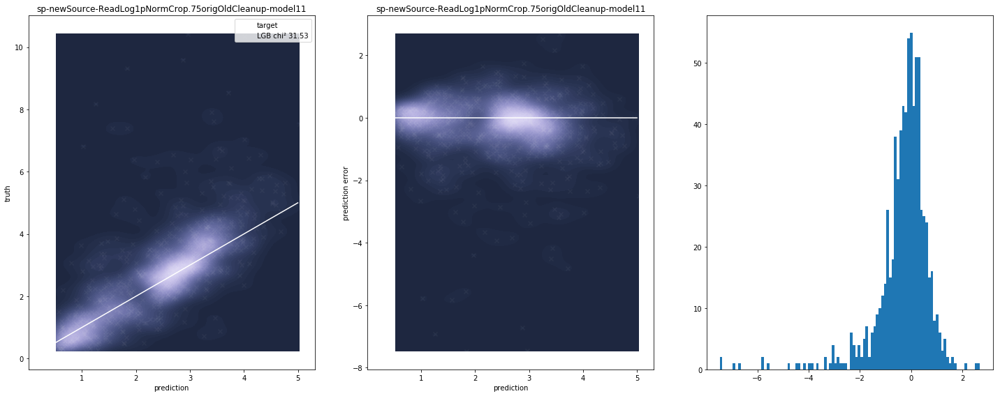

100%|██████████| 39/39 [01:03<00:00,  1.36s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.852343	training's Chi²: 76.5	valid_1's rmse: 0.94974	valid_1's Chi²: 96.2
[200]	training's rmse: 0.593657	training's Chi²: 37.1	valid_1's rmse: 0.785039	valid_1's Chi²: 65.7
[300]	training's rmse: 0.508395	training's Chi²: 27.2	valid_1's rmse: 0.740187	valid_1's Chi²: 58.4
[400]	training's rmse: 0.468181	training's Chi²: 23.1	valid_1's rmse: 0.725767	valid_1's Chi²: 56.2
[500]	training's rmse: 0.441081	training's Chi²: 20.5	valid_1's rmse: 0.720563	valid_1's Chi²: 55.4
[600]	training's rmse: 0.420268	training's Chi²: 18.6	valid_1's rmse: 0.720852	valid_1's Chi²: 55.4
Early stopping, best iteration is:
[537]	training's rmse: 0.43288	training's Chi²: 19.7	valid_1's rmse: 0.719638	valid_1's Chi²: 55.2
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.846748	training's Chi²: 76.2	valid_1's rmse: 1.06072	valid_1's Chi²: 113.4
[200]	training's rmse: 0.595934	training'

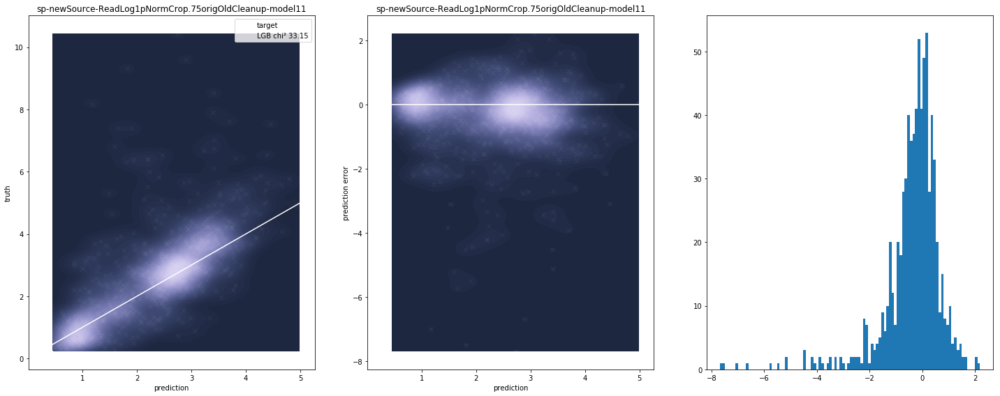

100%|██████████| 39/39 [01:01<00:00,  1.35s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.845141	training's Chi²: 75.2	valid_1's rmse: 0.941723	valid_1's Chi²: 94.6
[200]	training's rmse: 0.584565	training's Chi²: 36	valid_1's rmse: 0.769945	valid_1's Chi²: 63.2
[300]	training's rmse: 0.500676	training's Chi²: 26.4	valid_1's rmse: 0.723167	valid_1's Chi²: 55.8
[400]	training's rmse: 0.460828	training's Chi²: 22.4	valid_1's rmse: 0.697439	valid_1's Chi²: 51.9
[500]	training's rmse: 0.433814	training's Chi²: 19.8	valid_1's rmse: 0.687521	valid_1's Chi²: 50.4
[600]	training's rmse: 0.413317	training's Chi²: 18	valid_1's rmse: 0.683267	valid_1's Chi²: 49.8
Early stopping, best iteration is:
[567]	training's rmse: 0.419804	training's Chi²: 18.6	valid_1's rmse: 0.683499	valid_1's Chi²: 49.8
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.835145	training's Chi²: 74.1	valid_1's rmse: 1.06841	valid_1's Chi²: 115
[200]	training's rmse: 0.584253	training's Ch

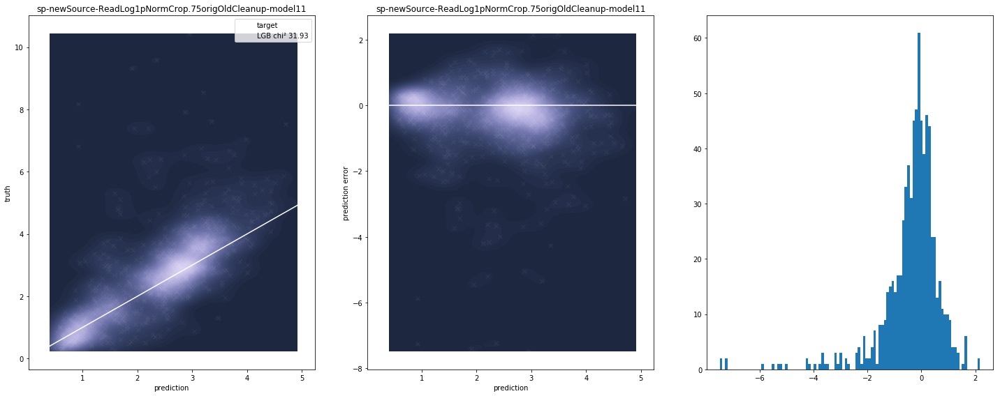

100%|██████████| 39/39 [15:26<00:00, 19.86s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.835185	training's Chi²: 73.4	valid_1's rmse: 0.929225	valid_1's Chi²: 92.1
[200]	training's rmse: 0.575938	training's Chi²: 34.9	valid_1's rmse: 0.744836	valid_1's Chi²: 59.2
[300]	training's rmse: 0.493752	training's Chi²: 25.7	valid_1's rmse: 0.694314	valid_1's Chi²: 51.4
[400]	training's rmse: 0.454542	training's Chi²: 21.7	valid_1's rmse: 0.678747	valid_1's Chi²: 49.1
[500]	training's rmse: 0.428765	training's Chi²: 19.4	valid_1's rmse: 0.671567	valid_1's Chi²: 48.1
Early stopping, best iteration is:
[490]	training's rmse: 0.431056	training's Chi²: 19.6	valid_1's rmse: 0.671704	valid_1's Chi²: 48.1
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.828103	training's Chi²: 72.9	valid_1's rmse: 1.08565	valid_1's Chi²: 118.7
[200]	training's rmse: 0.574873	training's Chi²: 35.1	valid_1's rmse: 0.862797	valid_1's Chi²: 75
[300]	training's rmse: 0.494517	training'

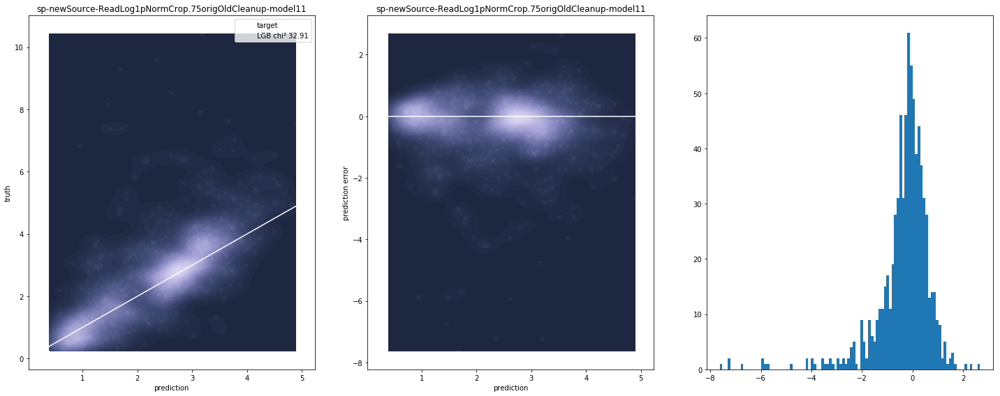

100%|██████████| 39/39 [01:02<00:00,  1.38s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.848036	training's Chi²: 75.7	valid_1's rmse: 0.95894	valid_1's Chi²: 98.1
[200]	training's rmse: 0.589013	training's Chi²: 36.5	valid_1's rmse: 0.781824	valid_1's Chi²: 65.2
[300]	training's rmse: 0.502537	training's Chi²: 26.6	valid_1's rmse: 0.734255	valid_1's Chi²: 57.5
[400]	training's rmse: 0.461515	training's Chi²: 22.4	valid_1's rmse: 0.724528	valid_1's Chi²: 56
Early stopping, best iteration is:
[396]	training's rmse: 0.462768	training's Chi²: 22.5	valid_1's rmse: 0.72419	valid_1's Chi²: 55.9
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.839292	training's Chi²: 74.9	valid_1's rmse: 1.09886	valid_1's Chi²: 121.7
[200]	training's rmse: 0.587805	training's Chi²: 36.7	valid_1's rmse: 0.876333	valid_1's Chi²: 77.4
[300]	training's rmse: 0.503675	training's Chi²: 27	valid_1's rmse: 0.812936	valid_1's Chi²: 66.6
[400]	training's rmse: 0.462068	training's Ch

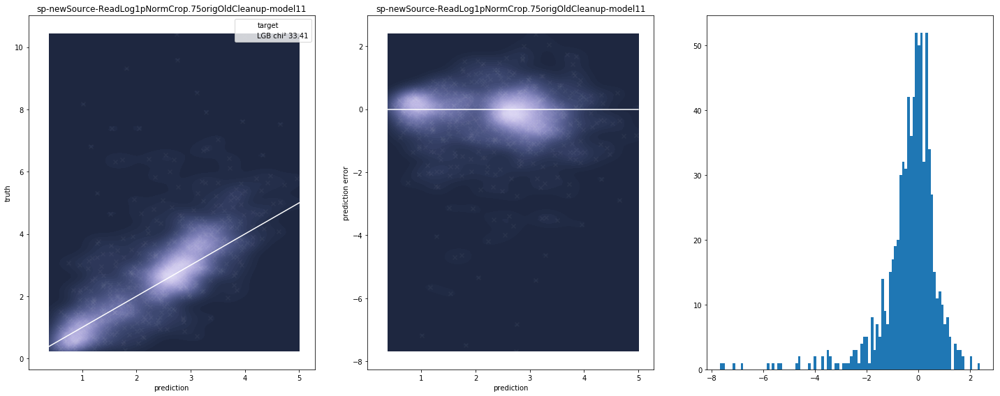

100%|██████████| 39/39 [01:02<00:00,  1.38s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.8398	training's Chi²: 74.2	valid_1's rmse: 0.931975	valid_1's Chi²: 92.7
[200]	training's rmse: 0.581623	training's Chi²: 35.6	valid_1's rmse: 0.747364	valid_1's Chi²: 59.6
[300]	training's rmse: 0.499422	training's Chi²: 26.3	valid_1's rmse: 0.692034	valid_1's Chi²: 51.1
[400]	training's rmse: 0.460135	training's Chi²: 22.3	valid_1's rmse: 0.668679	valid_1's Chi²: 47.7
[500]	training's rmse: 0.433598	training's Chi²: 19.8	valid_1's rmse: 0.661451	valid_1's Chi²: 46.7
[600]	training's rmse: 0.413414	training's Chi²: 18	valid_1's rmse: 0.657498	valid_1's Chi²: 46.1
[700]	training's rmse: 0.396376	training's Chi²: 16.5	valid_1's rmse: 0.655313	valid_1's Chi²: 45.8
Early stopping, best iteration is:
[680]	training's rmse: 0.399583	training's Chi²: 16.8	valid_1's rmse: 0.65553	valid_1's Chi²: 45.8
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.829278	training's C

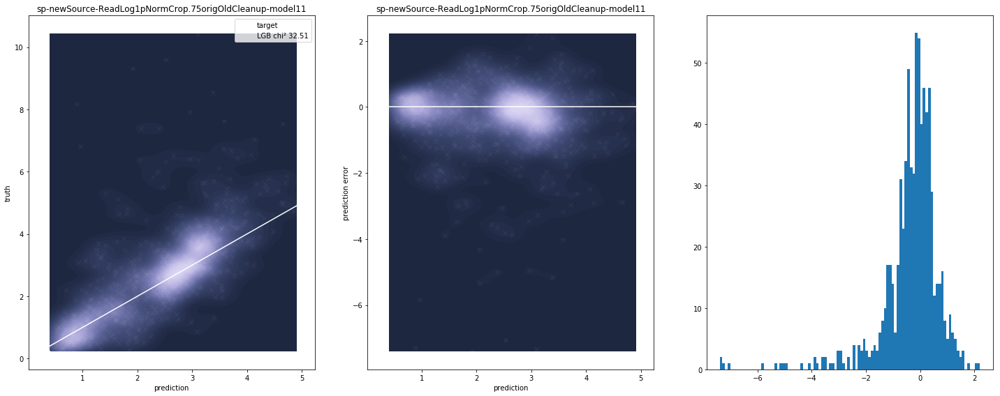

100%|██████████| 39/39 [15:30<00:00, 20.21s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.837068	training's Chi²: 73.8	valid_1's rmse: 0.93469	valid_1's Chi²: 93.2
[200]	training's rmse: 0.577395	training's Chi²: 35.1	valid_1's rmse: 0.754033	valid_1's Chi²: 60.7
[300]	training's rmse: 0.494656	training's Chi²: 25.8	valid_1's rmse: 0.699158	valid_1's Chi²: 52.1
[400]	training's rmse: 0.455463	training's Chi²: 21.8	valid_1's rmse: 0.677589	valid_1's Chi²: 49
[500]	training's rmse: 0.429453	training's Chi²: 19.4	valid_1's rmse: 0.670427	valid_1's Chi²: 47.9
[600]	training's rmse: 0.409074	training's Chi²: 17.6	valid_1's rmse: 0.668291	valid_1's Chi²: 47.6
Early stopping, best iteration is:
[565]	training's rmse: 0.415712	training's Chi²: 18.2	valid_1's rmse: 0.668263	valid_1's Chi²: 47.6
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.827343	training's Chi²: 72.7	valid_1's rmse: 1.07393	valid_1's Chi²: 116.2
[200]	training's rmse: 0.574977	training's

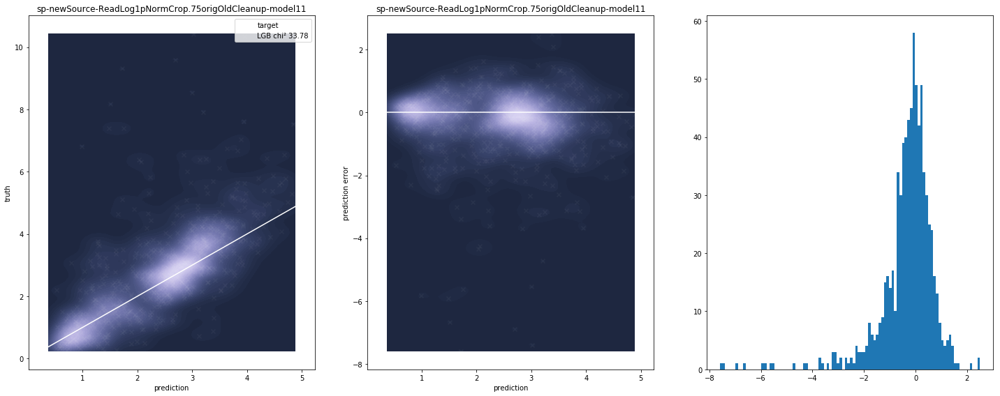

100%|██████████| 39/39 [01:01<00:00,  1.35s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.845141	training's Chi²: 75.2	valid_1's rmse: 0.941715	valid_1's Chi²: 94.6
[200]	training's rmse: 0.584658	training's Chi²: 36	valid_1's rmse: 0.771467	valid_1's Chi²: 63.5
[300]	training's rmse: 0.500948	training's Chi²: 26.4	valid_1's rmse: 0.723086	valid_1's Chi²: 55.8
[400]	training's rmse: 0.461093	training's Chi²: 22.4	valid_1's rmse: 0.698671	valid_1's Chi²: 52.1
[500]	training's rmse: 0.433919	training's Chi²: 19.8	valid_1's rmse: 0.688346	valid_1's Chi²: 50.5
[600]	training's rmse: 0.413428	training's Chi²: 18	valid_1's rmse: 0.685838	valid_1's Chi²: 50.2
[700]	training's rmse: 0.395993	training's Chi²: 16.5	valid_1's rmse: 0.686	valid_1's Chi²: 50.2
Early stopping, best iteration is:
[615]	training's rmse: 0.410632	training's Chi²: 17.8	valid_1's rmse: 0.685578	valid_1's Chi²: 50.1
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.835013	training's Chi

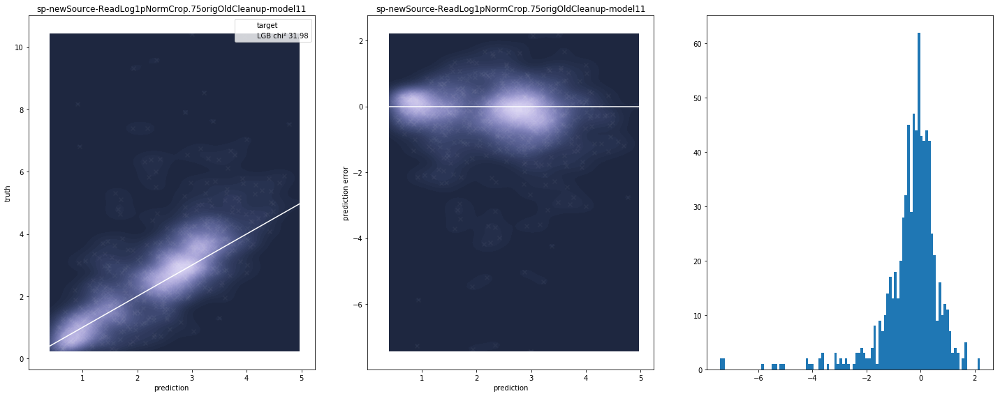

100%|██████████| 39/39 [01:02<00:00,  1.36s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.839774	training's Chi²: 74.2	valid_1's rmse: 0.927695	valid_1's Chi²: 91.8
[200]	training's rmse: 0.58183	training's Chi²: 35.6	valid_1's rmse: 0.743821	valid_1's Chi²: 59
[300]	training's rmse: 0.49939	training's Chi²: 26.3	valid_1's rmse: 0.689381	valid_1's Chi²: 50.7
[400]	training's rmse: 0.460114	training's Chi²: 22.3	valid_1's rmse: 0.666187	valid_1's Chi²: 47.3
[500]	training's rmse: 0.433384	training's Chi²: 19.8	valid_1's rmse: 0.658281	valid_1's Chi²: 46.2
[600]	training's rmse: 0.413072	training's Chi²: 18	valid_1's rmse: 0.653343	valid_1's Chi²: 45.5
[700]	training's rmse: 0.396235	training's Chi²: 16.5	valid_1's rmse: 0.650874	valid_1's Chi²: 45.2
[800]	training's rmse: 0.380901	training's Chi²: 15.3	valid_1's rmse: 0.652242	valid_1's Chi²: 45.4
Early stopping, best iteration is:
[711]	training's rmse: 0.394391	training's Chi²: 16.4	valid_1's rmse: 0.650547	valid_1's Chi²: 45.1
Training

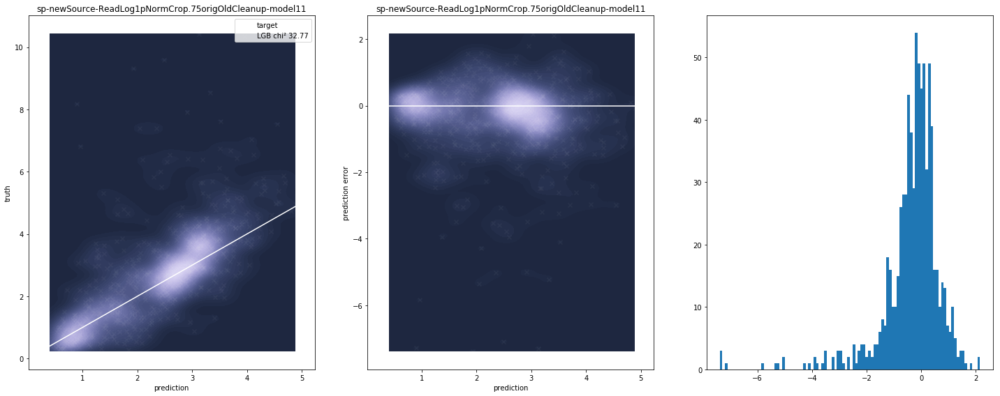

100%|██████████| 39/39 [09:32<00:00, 12.31s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.826928	training's Chi²: 72	valid_1's rmse: 0.915353	valid_1's Chi²: 89.4
[200]	training's rmse: 0.565387	training's Chi²: 33.7	valid_1's rmse: 0.735894	valid_1's Chi²: 57.8
[300]	training's rmse: 0.485269	training's Chi²: 24.8	valid_1's rmse: 0.68743	valid_1's Chi²: 50.4
[400]	training's rmse: 0.447155	training's Chi²: 21	valid_1's rmse: 0.669217	valid_1's Chi²: 47.8
[500]	training's rmse: 0.422264	training's Chi²: 18.8	valid_1's rmse: 0.66665	valid_1's Chi²: 47.4
[600]	training's rmse: 0.40341	training's Chi²: 17.1	valid_1's rmse: 0.665561	valid_1's Chi²: 47.3
Early stopping, best iteration is:
[532]	training's rmse: 0.415785	training's Chi²: 18.2	valid_1's rmse: 0.665475	valid_1's Chi²: 47.2
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.818218	training's Chi²: 71.1	valid_1's rmse: 1.06673	valid_1's Chi²: 114.6
[200]	training's rmse: 0.564199	training's Chi

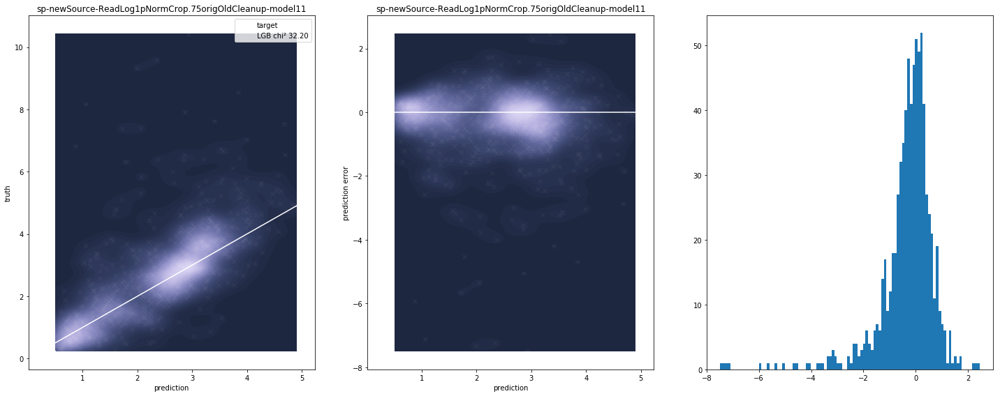

100%|██████████| 39/39 [16:24<00:00, 20.71s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.829205	training's Chi²: 72.4	valid_1's rmse: 0.926563	valid_1's Chi²: 91.6
[200]	training's rmse: 0.566936	training's Chi²: 33.8	valid_1's rmse: 0.739065	valid_1's Chi²: 58.3
[300]	training's rmse: 0.485716	training's Chi²: 24.8	valid_1's rmse: 0.690617	valid_1's Chi²: 50.9
[400]	training's rmse: 0.446681	training's Chi²: 21	valid_1's rmse: 0.673852	valid_1's Chi²: 48.4
[500]	training's rmse: 0.421446	training's Chi²: 18.7	valid_1's rmse: 0.665071	valid_1's Chi²: 47.2
[600]	training's rmse: 0.401995	training's Chi²: 17	valid_1's rmse: 0.661961	valid_1's Chi²: 46.7
[700]	training's rmse: 0.384879	training's Chi²: 15.6	valid_1's rmse: 0.661226	valid_1's Chi²: 46.6
Early stopping, best iteration is:
[643]	training's rmse: 0.394385	training's Chi²: 16.4	valid_1's rmse: 0.660521	valid_1's Chi²: 46.5
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.821775	training's 

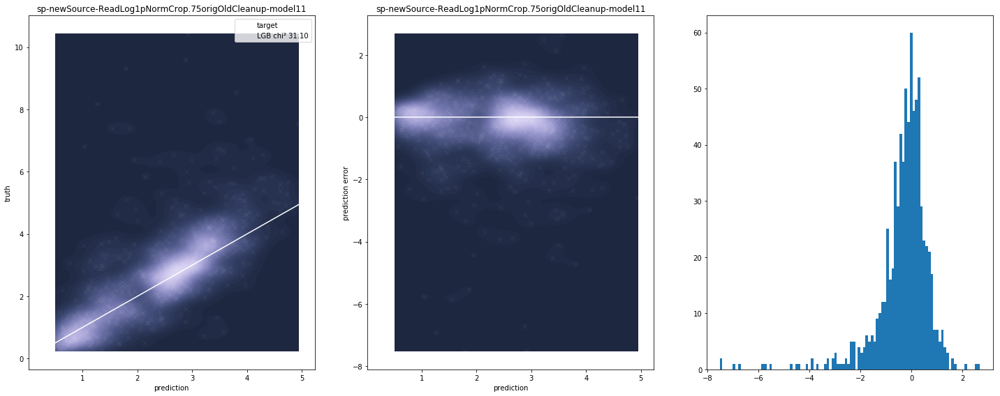

100%|██████████| 39/39 [16:11<00:00, 20.57s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.832831	training's Chi²: 73	valid_1's rmse: 0.931746	valid_1's Chi²: 92.6
[200]	training's rmse: 0.570848	training's Chi²: 34.3	valid_1's rmse: 0.752383	valid_1's Chi²: 60.4
[300]	training's rmse: 0.488251	training's Chi²: 25.1	valid_1's rmse: 0.694994	valid_1's Chi²: 51.5
[400]	training's rmse: 0.449151	training's Chi²: 21.2	valid_1's rmse: 0.683874	valid_1's Chi²: 49.9
[500]	training's rmse: 0.423451	training's Chi²: 18.9	valid_1's rmse: 0.672534	valid_1's Chi²: 48.3
[600]	training's rmse: 0.403792	training's Chi²: 17.2	valid_1's rmse: 0.669217	valid_1's Chi²: 47.8
[700]	training's rmse: 0.386765	training's Chi²: 15.7	valid_1's rmse: 0.667897	valid_1's Chi²: 47.6
Early stopping, best iteration is:
[644]	training's rmse: 0.396088	training's Chi²: 16.5	valid_1's rmse: 0.668326	valid_1's Chi²: 47.6
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.826137	training'

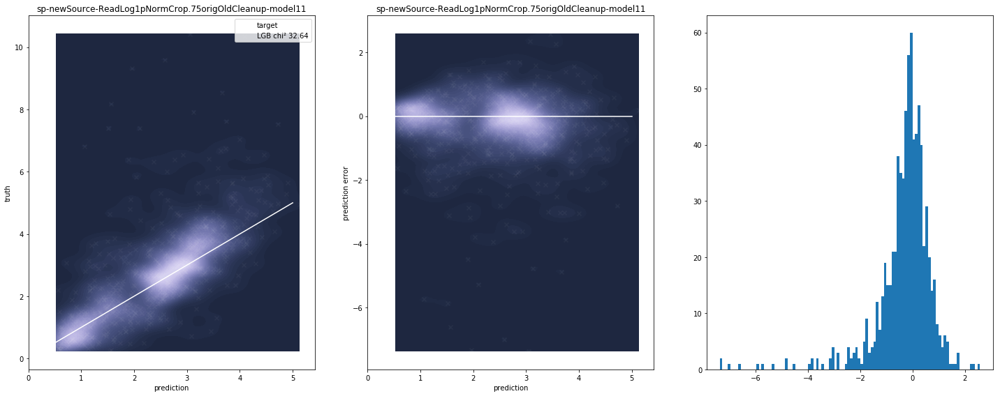

100%|██████████| 39/39 [16:20<00:00, 20.80s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.826055	training's Chi²: 71.8	valid_1's rmse: 0.918895	valid_1's Chi²: 90.1
[200]	training's rmse: 0.563241	training's Chi²: 33.4	valid_1's rmse: 0.733782	valid_1's Chi²: 57.4
[300]	training's rmse: 0.483444	training's Chi²: 24.6	valid_1's rmse: 0.678987	valid_1's Chi²: 49.2
[400]	training's rmse: 0.445146	training's Chi²: 20.9	valid_1's rmse: 0.659275	valid_1's Chi²: 46.4
[500]	training's rmse: 0.419857	training's Chi²: 18.6	valid_1's rmse: 0.652534	valid_1's Chi²: 45.4
[600]	training's rmse: 0.400538	training's Chi²: 16.9	valid_1's rmse: 0.651124	valid_1's Chi²: 45.2
Early stopping, best iteration is:
[559]	training's rmse: 0.408007	training's Chi²: 17.5	valid_1's rmse: 0.651196	valid_1's Chi²: 45.2
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.817602	training's Chi²: 71	valid_1's rmse: 1.06348	valid_1's Chi²: 113.9
[200]	training's rmse: 0.56264	training's

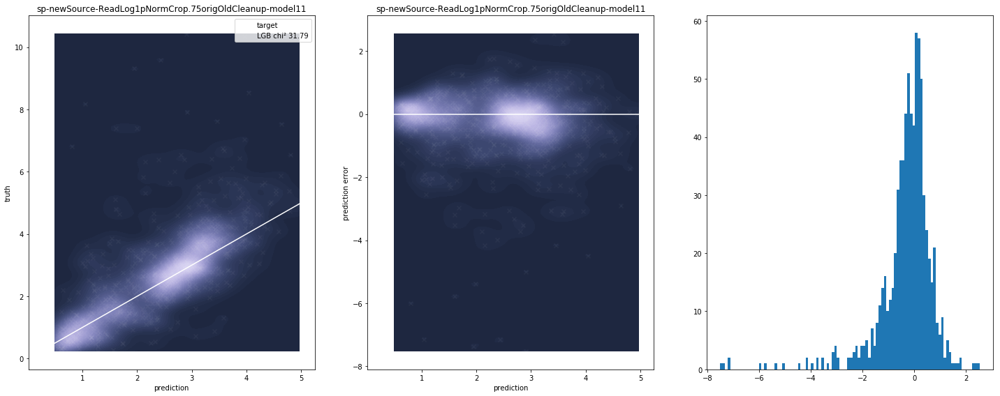

100%|██████████| 39/39 [01:37<00:00,  2.04s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.841999	training's Chi²: 74.6	valid_1's rmse: 0.932244	valid_1's Chi²: 92.7
[200]	training's rmse: 0.583853	training's Chi²: 35.9	valid_1's rmse: 0.758021	valid_1's Chi²: 61.3
[300]	training's rmse: 0.499864	training's Chi²: 26.3	valid_1's rmse: 0.70475	valid_1's Chi²: 53
[400]	training's rmse: 0.45997	training's Chi²: 22.3	valid_1's rmse: 0.686941	valid_1's Chi²: 50.3
[500]	training's rmse: 0.433177	training's Chi²: 19.8	valid_1's rmse: 0.674582	valid_1's Chi²: 48.5
[600]	training's rmse: 0.412888	training's Chi²: 17.9	valid_1's rmse: 0.672704	valid_1's Chi²: 48.3
[700]	training's rmse: 0.395969	training's Chi²: 16.5	valid_1's rmse: 0.671142	valid_1's Chi²: 48.1
[800]	training's rmse: 0.381359	training's Chi²: 15.3	valid_1's rmse: 0.671786	valid_1's Chi²: 48.1
Early stopping, best iteration is:
[701]	training's rmse: 0.395813	training's Chi²: 16.5	valid_1's rmse: 0.671123	valid_1's Chi²: 48
Training

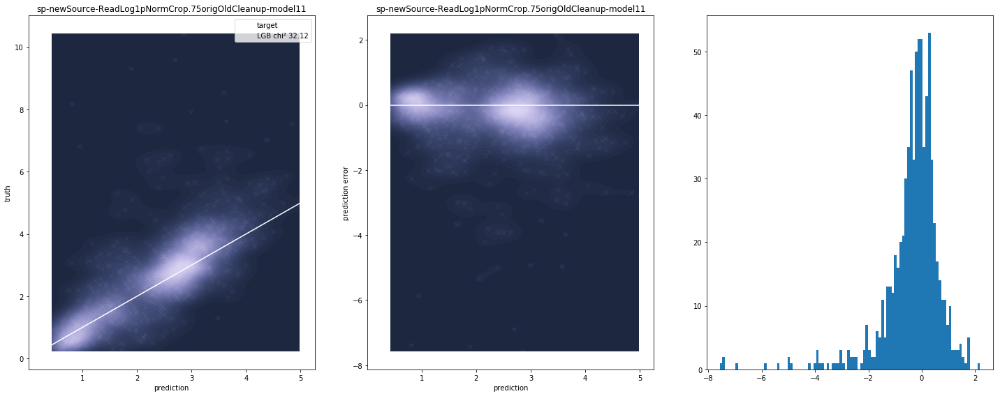

100%|██████████| 39/39 [16:15<00:00, 21.28s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.836688	training's Chi²: 73.7	valid_1's rmse: 0.930197	valid_1's Chi²: 92.3
[200]	training's rmse: 0.575219	training's Chi²: 34.8	valid_1's rmse: 0.763052	valid_1's Chi²: 62.1
[300]	training's rmse: 0.493122	training's Chi²: 25.6	valid_1's rmse: 0.719434	valid_1's Chi²: 55.2
[400]	training's rmse: 0.454465	training's Chi²: 21.7	valid_1's rmse: 0.702038	valid_1's Chi²: 52.6
[500]	training's rmse: 0.428239	training's Chi²: 19.3	valid_1's rmse: 0.695257	valid_1's Chi²: 51.6
[600]	training's rmse: 0.407666	training's Chi²: 17.5	valid_1's rmse: 0.691421	valid_1's Chi²: 51
[700]	training's rmse: 0.390436	training's Chi²: 16	valid_1's rmse: 0.690742	valid_1's Chi²: 50.9
Early stopping, best iteration is:
[625]	training's rmse: 0.403245	training's Chi²: 17.1	valid_1's rmse: 0.690382	valid_1's Chi²: 50.8
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.828929	training's 

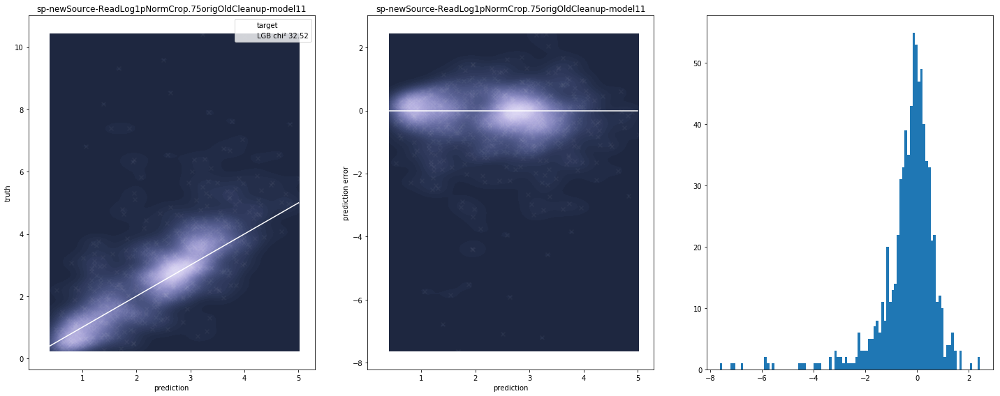

100%|██████████| 39/39 [01:36<00:00,  2.04s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.842006	training's Chi²: 74.6	valid_1's rmse: 0.929719	valid_1's Chi²: 92.2
[200]	training's rmse: 0.583202	training's Chi²: 35.8	valid_1's rmse: 0.753706	valid_1's Chi²: 60.6
[300]	training's rmse: 0.49977	training's Chi²: 26.3	valid_1's rmse: 0.700602	valid_1's Chi²: 52.4
[400]	training's rmse: 0.459783	training's Chi²: 22.3	valid_1's rmse: 0.682146	valid_1's Chi²: 49.6
[500]	training's rmse: 0.433042	training's Chi²: 19.7	valid_1's rmse: 0.669454	valid_1's Chi²: 47.8
[600]	training's rmse: 0.41302	training's Chi²: 18	valid_1's rmse: 0.666072	valid_1's Chi²: 47.3
[700]	training's rmse: 0.396193	training's Chi²: 16.5	valid_1's rmse: 0.665858	valid_1's Chi²: 47.3
Early stopping, best iteration is:
[610]	training's rmse: 0.411177	training's Chi²: 17.8	valid_1's rmse: 0.665502	valid_1's Chi²: 47.2
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.83162	training's C

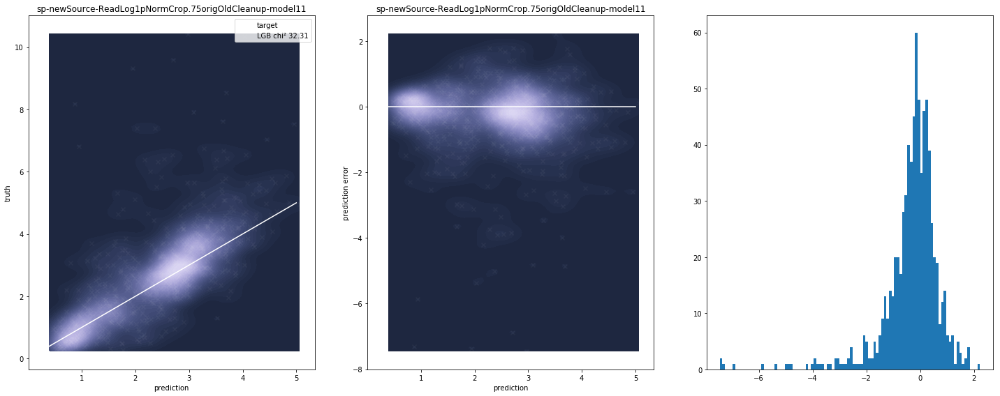

 77%|███████▋  | 30/39 [07:39<02:12, 14.78s/it]/mnt/reds/projects/astrohack/astrohack.py:227: RuntimeWarning: invalid value encountered in true_divide
  A /= np.std(A)
100%|██████████| 39/39 [09:46<00:00, 12.57s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.833223	training's Chi²: 73.1	valid_1's rmse: 0.929225	valid_1's Chi²: 92.1
[200]	training's rmse: 0.571808	training's Chi²: 34.4	valid_1's rmse: 0.751074	valid_1's Chi²: 60.2
[300]	training's rmse: 0.49065	training's Chi²: 25.3	valid_1's rmse: 0.695588	valid_1's Chi²: 51.6
[400]	training's rmse: 0.452618	training's Chi²: 21.6	valid_1's rmse: 0.679922	valid_1's Chi²: 49.3
[500]	training's rmse: 0.427603	training's Chi²: 19.2	valid_1's rmse: 0.674356	valid_1's Chi²: 48.5
[600]	training's rmse: 0.407952	training's Chi²: 17.5	valid_1's rmse: 0.674987	valid_1's Chi²: 48.6
Early stopping, best iteration is:
[511]	training's rmse: 0.425287	training's Chi²: 19	valid_1's rmse: 0.673889	valid_1's Chi²: 48.4
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.823595	training's Chi²: 72.1	valid_1's rmse: 1.10896	valid_1's Chi²: 123.9
[200]	training's rmse: 0.570544	training's

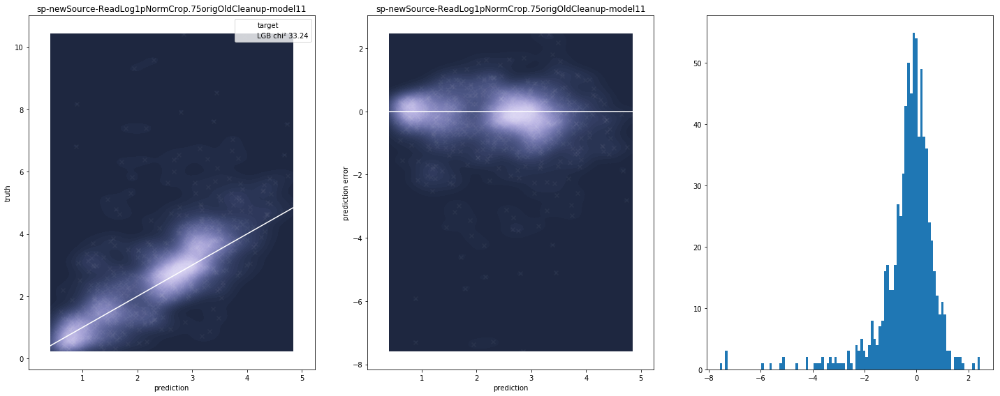

100%|██████████| 39/39 [16:11<00:00, 20.71s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.837	training's Chi²: 73.7	valid_1's rmse: 0.935321	valid_1's Chi²: 93.3
[200]	training's rmse: 0.575009	training's Chi²: 34.8	valid_1's rmse: 0.760587	valid_1's Chi²: 61.7
[300]	training's rmse: 0.492329	training's Chi²: 25.5	valid_1's rmse: 0.723209	valid_1's Chi²: 55.8
[400]	training's rmse: 0.453506	training's Chi²: 21.7	valid_1's rmse: 0.707764	valid_1's Chi²: 53.4
[500]	training's rmse: 0.427797	training's Chi²: 19.3	valid_1's rmse: 0.699644	valid_1's Chi²: 52.2
[600]	training's rmse: 0.407804	training's Chi²: 17.5	valid_1's rmse: 0.696171	valid_1's Chi²: 51.7
[700]	training's rmse: 0.390475	training's Chi²: 16.1	valid_1's rmse: 0.693265	valid_1's Chi²: 51.3
[800]	training's rmse: 0.375215	training's Chi²: 14.8	valid_1's rmse: 0.693967	valid_1's Chi²: 51.4
Early stopping, best iteration is:
[712]	training's rmse: 0.388509	training's Chi²: 15.9	valid_1's rmse: 0.693088	valid_1's Chi²: 51.2
Train

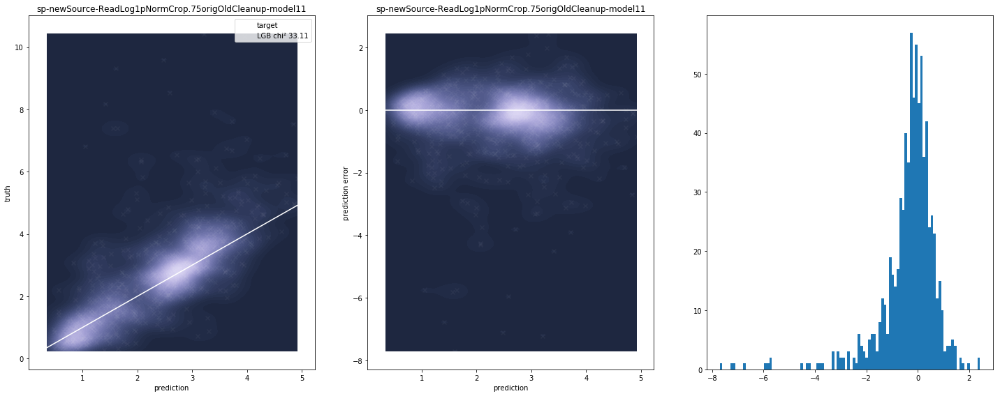

100%|██████████| 39/39 [16:53<00:00, 23.25s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.831964	training's Chi²: 72.9	valid_1's rmse: 0.928338	valid_1's Chi²: 91.9
[200]	training's rmse: 0.570238	training's Chi²: 34.2	valid_1's rmse: 0.750938	valid_1's Chi²: 60.2
[300]	training's rmse: 0.489394	training's Chi²: 25.2	valid_1's rmse: 0.702815	valid_1's Chi²: 52.7
[400]	training's rmse: 0.451889	training's Chi²: 21.5	valid_1's rmse: 0.684569	valid_1's Chi²: 50
[500]	training's rmse: 0.426379	training's Chi²: 19.1	valid_1's rmse: 0.67696	valid_1's Chi²: 48.9
[600]	training's rmse: 0.406722	training's Chi²: 17.4	valid_1's rmse: 0.674639	valid_1's Chi²: 48.6
[700]	training's rmse: 0.390058	training's Chi²: 16	valid_1's rmse: 0.673579	valid_1's Chi²: 48.4
[800]	training's rmse: 0.375074	training's Chi²: 14.8	valid_1's rmse: 0.673102	valid_1's Chi²: 48.3
Early stopping, best iteration is:
[731]	training's rmse: 0.385226	training's Chi²: 15.6	valid_1's rmse: 0.673142	valid_1's Chi²: 48.3
Trainin

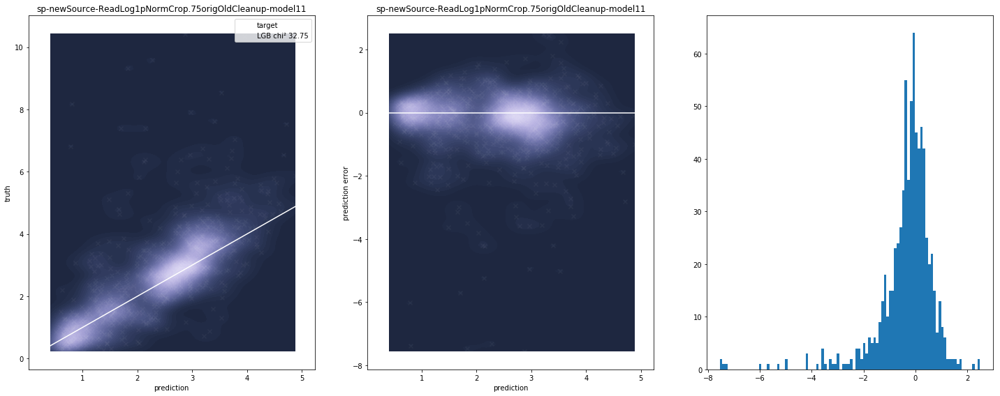

100%|██████████| 39/39 [01:33<00:00,  1.98s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.839794	training's Chi²: 74.2	valid_1's rmse: 0.931958	valid_1's Chi²: 92.7
[200]	training's rmse: 0.58159	training's Chi²: 35.6	valid_1's rmse: 0.746209	valid_1's Chi²: 59.4
[300]	training's rmse: 0.499418	training's Chi²: 26.3	valid_1's rmse: 0.691126	valid_1's Chi²: 51
[400]	training's rmse: 0.46009	training's Chi²: 22.3	valid_1's rmse: 0.667728	valid_1's Chi²: 47.6
[500]	training's rmse: 0.433407	training's Chi²: 19.8	valid_1's rmse: 0.658722	valid_1's Chi²: 46.3
[600]	training's rmse: 0.413189	training's Chi²: 18	valid_1's rmse: 0.655154	valid_1's Chi²: 45.8
[700]	training's rmse: 0.396325	training's Chi²: 16.5	valid_1's rmse: 0.654858	valid_1's Chi²: 45.7
Early stopping, best iteration is:
[666]	training's rmse: 0.401706	training's Chi²: 17	valid_1's rmse: 0.654109	valid_1's Chi²: 45.6
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.829278	training's Chi²

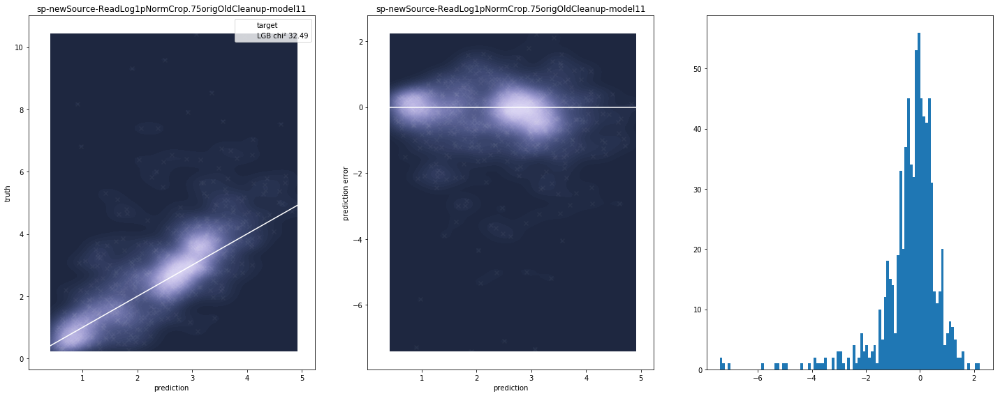

100%|██████████| 39/39 [16:12<00:00, 20.67s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.838498	training's Chi²: 74	valid_1's rmse: 0.925306	valid_1's Chi²: 91.3
[200]	training's rmse: 0.579642	training's Chi²: 35.4	valid_1's rmse: 0.747755	valid_1's Chi²: 59.6
[300]	training's rmse: 0.497835	training's Chi²: 26.1	valid_1's rmse: 0.692626	valid_1's Chi²: 51.2
[400]	training's rmse: 0.458337	training's Chi²: 22.1	valid_1's rmse: 0.677398	valid_1's Chi²: 49
[500]	training's rmse: 0.432239	training's Chi²: 19.7	valid_1's rmse: 0.678574	valid_1's Chi²: 49.1
Early stopping, best iteration is:
[428]	training's rmse: 0.450187	training's Chi²: 21.3	valid_1's rmse: 0.6746	valid_1's Chi²: 48.5
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.829294	training's Chi²: 73.1	valid_1's rmse: 1.03875	valid_1's Chi²: 108.7
[200]	training's rmse: 0.577333	training's Chi²: 35.4	valid_1's rmse: 0.853205	valid_1's Chi²: 73.3
[300]	training's rmse: 0.497117	training's Ch

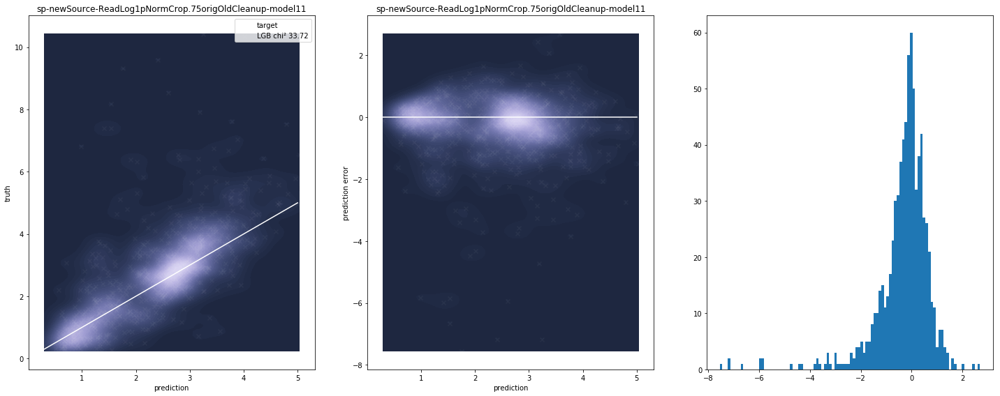

100%|██████████| 39/39 [01:33<00:00,  1.99s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.839794	training's Chi²: 74.2	valid_1's rmse: 0.931942	valid_1's Chi²: 92.7
[200]	training's rmse: 0.581643	training's Chi²: 35.6	valid_1's rmse: 0.745698	valid_1's Chi²: 59.3
[300]	training's rmse: 0.49941	training's Chi²: 26.3	valid_1's rmse: 0.691623	valid_1's Chi²: 51
[400]	training's rmse: 0.45993	training's Chi²: 22.3	valid_1's rmse: 0.669356	valid_1's Chi²: 47.8
[500]	training's rmse: 0.43344	training's Chi²: 19.8	valid_1's rmse: 0.661997	valid_1's Chi²: 46.8
[600]	training's rmse: 0.413066	training's Chi²: 18	valid_1's rmse: 0.657401	valid_1's Chi²: 46.1
[700]	training's rmse: 0.395993	training's Chi²: 16.5	valid_1's rmse: 0.654755	valid_1's Chi²: 45.7
Early stopping, best iteration is:
[661]	training's rmse: 0.402471	training's Chi²: 17.1	valid_1's rmse: 0.654852	valid_1's Chi²: 45.7
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.829278	training's Chi

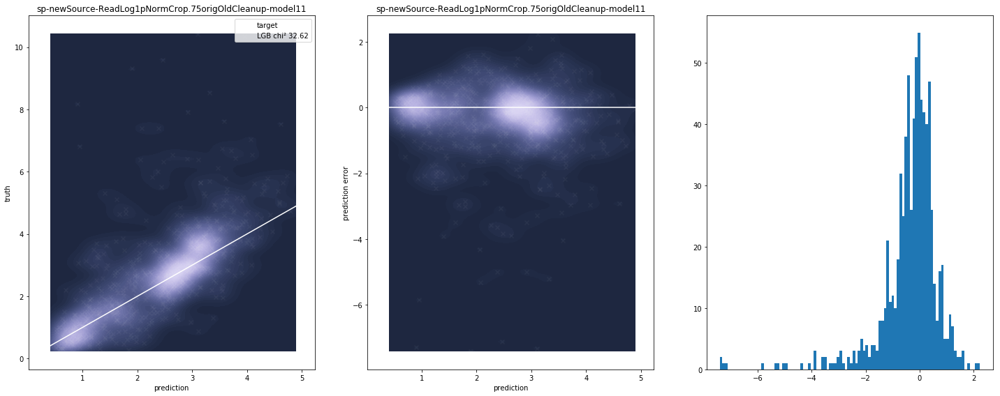

100%|██████████| 39/39 [09:52<00:00, 12.83s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.832481	training's Chi²: 73	valid_1's rmse: 0.923199	valid_1's Chi²: 90.9
[200]	training's rmse: 0.575099	training's Chi²: 34.8	valid_1's rmse: 0.739702	valid_1's Chi²: 58.4
[300]	training's rmse: 0.494885	training's Chi²: 25.8	valid_1's rmse: 0.682358	valid_1's Chi²: 49.7
[400]	training's rmse: 0.455538	training's Chi²: 21.8	valid_1's rmse: 0.666557	valid_1's Chi²: 47.4
[500]	training's rmse: 0.429169	training's Chi²: 19.4	valid_1's rmse: 0.659181	valid_1's Chi²: 46.4
Early stopping, best iteration is:
[490]	training's rmse: 0.431491	training's Chi²: 19.6	valid_1's rmse: 0.659054	valid_1's Chi²: 46.3
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.821801	training's Chi²: 71.8	valid_1's rmse: 1.07288	valid_1's Chi²: 116
[200]	training's rmse: 0.571289	training's Chi²: 34.7	valid_1's rmse: 0.855533	valid_1's Chi²: 73.7
[300]	training's rmse: 0.492514	training's 

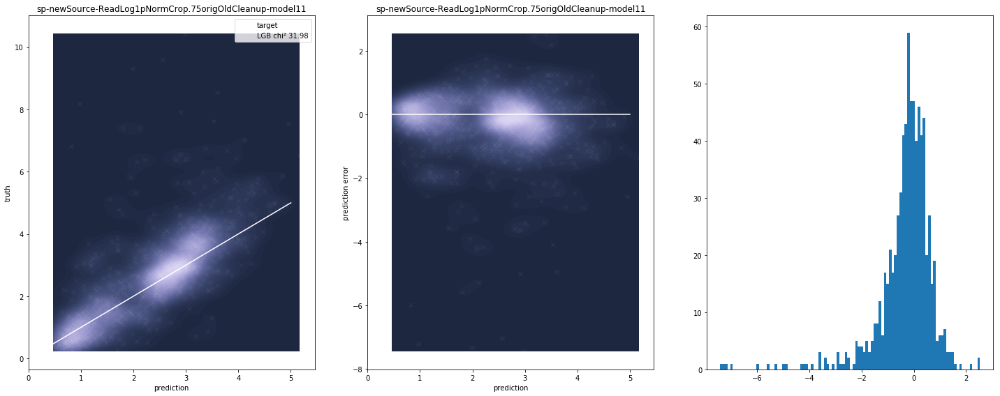

100%|██████████| 39/39 [16:12<00:00, 20.74s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.837016	training's Chi²: 73.8	valid_1's rmse: 0.935133	valid_1's Chi²: 93.3
[200]	training's rmse: 0.577533	training's Chi²: 35.1	valid_1's rmse: 0.756441	valid_1's Chi²: 61
[300]	training's rmse: 0.494573	training's Chi²: 25.7	valid_1's rmse: 0.702078	valid_1's Chi²: 52.6
[400]	training's rmse: 0.455379	training's Chi²: 21.8	valid_1's rmse: 0.682382	valid_1's Chi²: 49.7
[500]	training's rmse: 0.429705	training's Chi²: 19.4	valid_1's rmse: 0.67334	valid_1's Chi²: 48.4
[600]	training's rmse: 0.40918	training's Chi²: 17.6	valid_1's rmse: 0.671027	valid_1's Chi²: 48
[700]	training's rmse: 0.392079	training's Chi²: 16.2	valid_1's rmse: 0.671224	valid_1's Chi²: 48.1
Early stopping, best iteration is:
[623]	training's rmse: 0.40499	training's Chi²: 17.3	valid_1's rmse: 0.6704	valid_1's Chi²: 47.9
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.827343	training's Chi²:

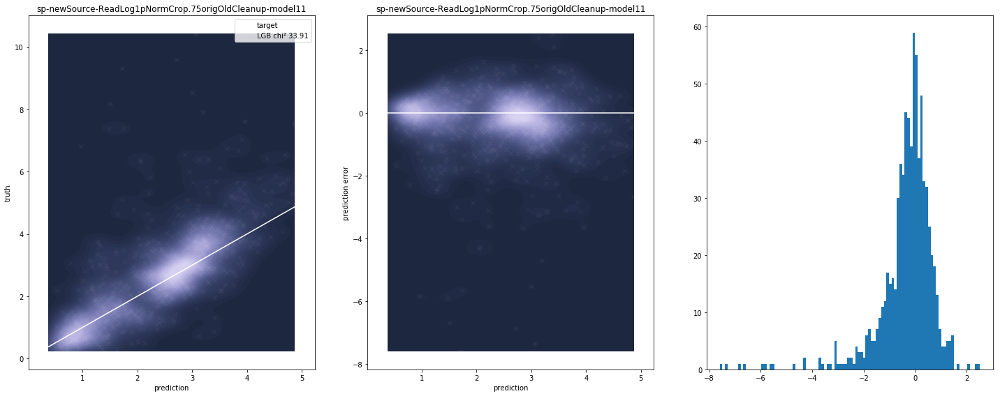

100%|██████████| 39/39 [18:07<00:00, 31.98s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.831677	training's Chi²: 72.8	valid_1's rmse: 0.919591	valid_1's Chi²: 90.2
[200]	training's rmse: 0.57182	training's Chi²: 34.4	valid_1's rmse: 0.735173	valid_1's Chi²: 57.7
[300]	training's rmse: 0.49166	training's Chi²: 25.4	valid_1's rmse: 0.681219	valid_1's Chi²: 49.5
[400]	training's rmse: 0.453087	training's Chi²: 21.6	valid_1's rmse: 0.660419	valid_1's Chi²: 46.5
[500]	training's rmse: 0.426881	training's Chi²: 19.2	valid_1's rmse: 0.656023	valid_1's Chi²: 45.9
Early stopping, best iteration is:
[477]	training's rmse: 0.432241	training's Chi²: 19.7	valid_1's rmse: 0.654702	valid_1's Chi²: 45.7
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.819643	training's Chi²: 71.4	valid_1's rmse: 1.07409	valid_1's Chi²: 116.2
[200]	training's rmse: 0.568659	training's Chi²: 34.4	valid_1's rmse: 0.841977	valid_1's Chi²: 71.4
[300]	training's rmse: 0.489532	training'

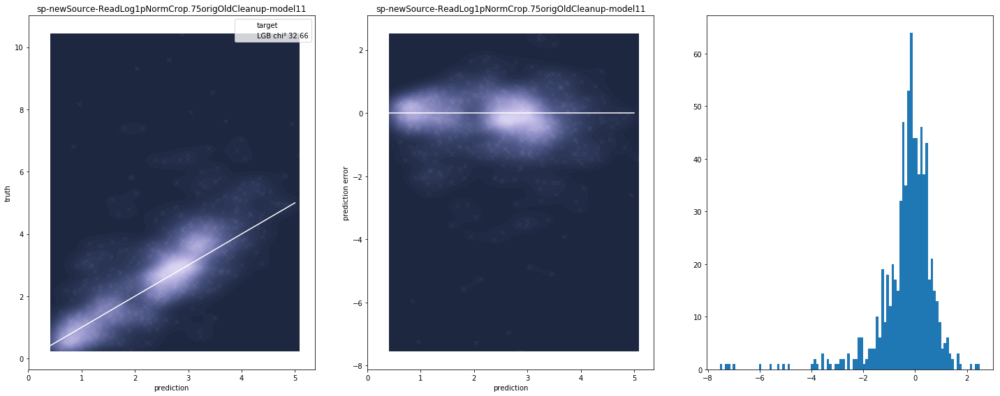

100%|██████████| 39/39 [01:26<00:00,  1.88s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.841044	training's Chi²: 74.5	valid_1's rmse: 0.9364	valid_1's Chi²: 93.5
[200]	training's rmse: 0.583077	training's Chi²: 35.8	valid_1's rmse: 0.759894	valid_1's Chi²: 61.6
[300]	training's rmse: 0.500186	training's Chi²: 26.3	valid_1's rmse: 0.707068	valid_1's Chi²: 53.3
[400]	training's rmse: 0.460105	training's Chi²: 22.3	valid_1's rmse: 0.688715	valid_1's Chi²: 50.6
[500]	training's rmse: 0.433603	training's Chi²: 19.8	valid_1's rmse: 0.677569	valid_1's Chi²: 49
[600]	training's rmse: 0.413278	training's Chi²: 18	valid_1's rmse: 0.674635	valid_1's Chi²: 48.6
Early stopping, best iteration is:
[558]	training's rmse: 0.42122	training's Chi²: 18.7	valid_1's rmse: 0.674472	valid_1's Chi²: 48.5
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.832035	training's Chi²: 73.6	valid_1's rmse: 1.10176	valid_1's Chi²: 122.3
[200]	training's rmse: 0.583085	training's Chi

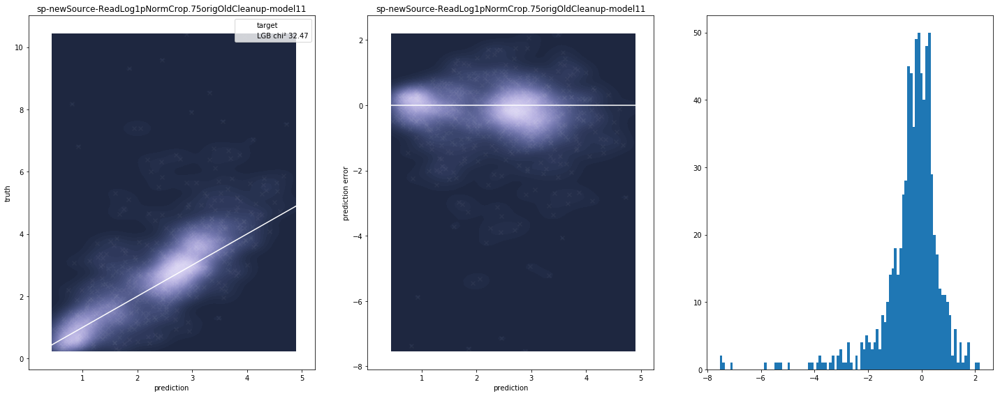

100%|██████████| 39/39 [09:37<00:00, 12.29s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.832437	training's Chi²: 72.9	valid_1's rmse: 0.936889	valid_1's Chi²: 93.6
[200]	training's rmse: 0.571777	training's Chi²: 34.4	valid_1's rmse: 0.756532	valid_1's Chi²: 61.1
[300]	training's rmse: 0.490754	training's Chi²: 25.4	valid_1's rmse: 0.708752	valid_1's Chi²: 53.6
[400]	training's rmse: 0.452559	training's Chi²: 21.6	valid_1's rmse: 0.690868	valid_1's Chi²: 50.9
[500]	training's rmse: 0.427036	training's Chi²: 19.2	valid_1's rmse: 0.686424	valid_1's Chi²: 50.3
Early stopping, best iteration is:
[478]	training's rmse: 0.431924	training's Chi²: 19.6	valid_1's rmse: 0.685604	valid_1's Chi²: 50.1
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.823671	training's Chi²: 72.1	valid_1's rmse: 1.10318	valid_1's Chi²: 122.6
[200]	training's rmse: 0.569989	training's Chi²: 34.5	valid_1's rmse: 0.902491	valid_1's Chi²: 82.1
[300]	training's rmse: 0.490835	trainin

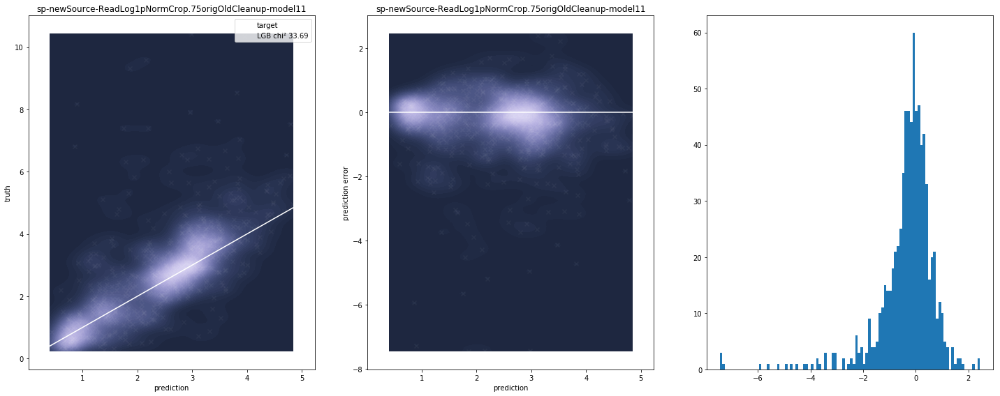

100%|██████████| 39/39 [01:31<00:00,  1.94s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.839831	training's Chi²: 74.2	valid_1's rmse: 0.927742	valid_1's Chi²: 91.8
[200]	training's rmse: 0.581811	training's Chi²: 35.6	valid_1's rmse: 0.743037	valid_1's Chi²: 58.9
[300]	training's rmse: 0.499166	training's Chi²: 26.2	valid_1's rmse: 0.687189	valid_1's Chi²: 50.4
[400]	training's rmse: 0.459928	training's Chi²: 22.3	valid_1's rmse: 0.664368	valid_1's Chi²: 47.1
[500]	training's rmse: 0.433583	training's Chi²: 19.8	valid_1's rmse: 0.656656	valid_1's Chi²: 46
[600]	training's rmse: 0.413011	training's Chi²: 18	valid_1's rmse: 0.65127	valid_1's Chi²: 45.2
[700]	training's rmse: 0.396	training's Chi²: 16.5	valid_1's rmse: 0.64938	valid_1's Chi²: 45
[800]	training's rmse: 0.380916	training's Chi²: 15.3	valid_1's rmse: 0.649671	valid_1's Chi²: 45
Early stopping, best iteration is:
[713]	training's rmse: 0.393984	training's Chi²: 16.3	valid_1's rmse: 0.64909	valid_1's Chi²: 44.9
Training until v

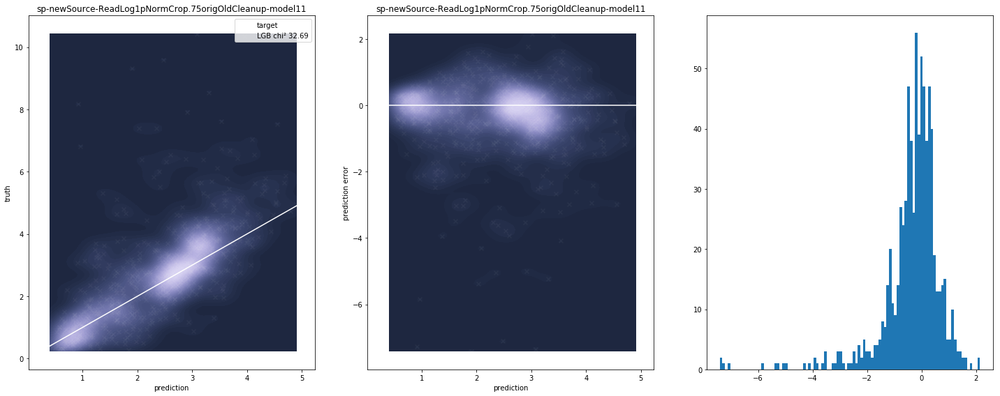

100%|██████████| 39/39 [14:52<00:00, 14.08s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.832436	training's Chi²: 72.9	valid_1's rmse: 0.917203	valid_1's Chi²: 89.7
[200]	training's rmse: 0.575358	training's Chi²: 34.8	valid_1's rmse: 0.727961	valid_1's Chi²: 56.5
[300]	training's rmse: 0.494472	training's Chi²: 25.7	valid_1's rmse: 0.671542	valid_1's Chi²: 48.1
[400]	training's rmse: 0.455367	training's Chi²: 21.8	valid_1's rmse: 0.656058	valid_1's Chi²: 45.9
[500]	training's rmse: 0.429189	training's Chi²: 19.4	valid_1's rmse: 0.645065	valid_1's Chi²: 44.4
[600]	training's rmse: 0.408658	training's Chi²: 17.6	valid_1's rmse: 0.641456	valid_1's Chi²: 43.9
Early stopping, best iteration is:
[567]	training's rmse: 0.415113	training's Chi²: 18.1	valid_1's rmse: 0.641722	valid_1's Chi²: 43.9
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.820969	training's Chi²: 71.6	valid_1's rmse: 1.08908	valid_1's Chi²: 119.5
[200]	training's rmse: 0.570379	trainin

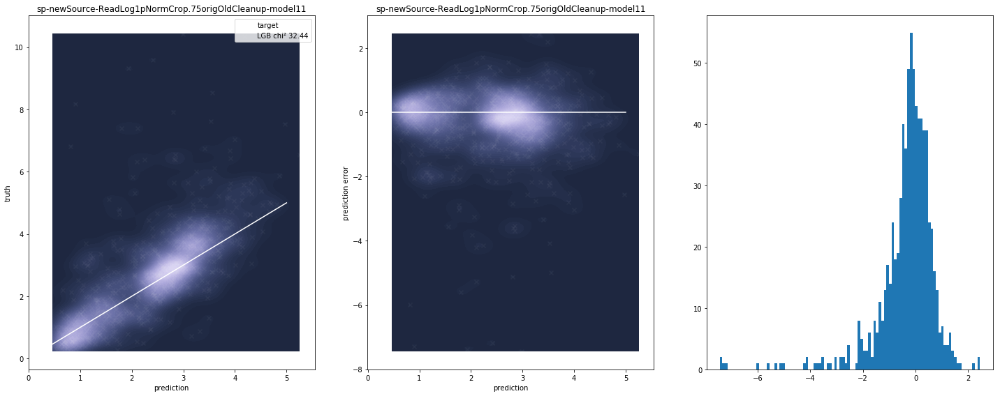

100%|██████████| 39/39 [09:28<00:00, 12.26s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.827016	training's Chi²: 72	valid_1's rmse: 0.915254	valid_1's Chi²: 89.4
[200]	training's rmse: 0.565634	training's Chi²: 33.7	valid_1's rmse: 0.734715	valid_1's Chi²: 57.6
[300]	training's rmse: 0.485698	training's Chi²: 24.8	valid_1's rmse: 0.686776	valid_1's Chi²: 50.3
[400]	training's rmse: 0.447165	training's Chi²: 21	valid_1's rmse: 0.668389	valid_1's Chi²: 47.7
[500]	training's rmse: 0.421928	training's Chi²: 18.7	valid_1's rmse: 0.666416	valid_1's Chi²: 47.4
[600]	training's rmse: 0.402593	training's Chi²: 17.1	valid_1's rmse: 0.668168	valid_1's Chi²: 47.6
Early stopping, best iteration is:
[503]	training's rmse: 0.421247	training's Chi²: 18.7	valid_1's rmse: 0.666035	valid_1's Chi²: 47.3
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.818142	training's Chi²: 71.1	valid_1's rmse: 1.07108	valid_1's Chi²: 115.6
[200]	training's rmse: 0.564108	training's 

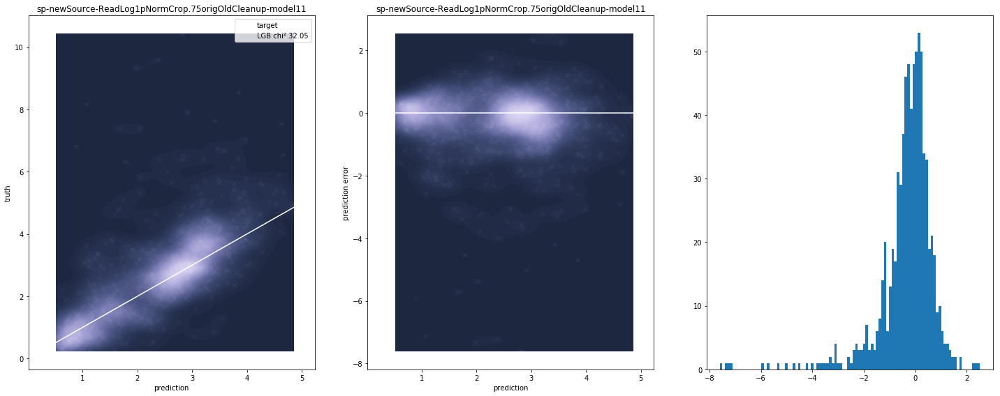

100%|██████████| 39/39 [09:37<00:00, 12.24s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.83167	training's Chi²: 72.8	valid_1's rmse: 0.914451	valid_1's Chi²: 89.2
[200]	training's rmse: 0.571569	training's Chi²: 34.4	valid_1's rmse: 0.73488	valid_1's Chi²: 57.6
[300]	training's rmse: 0.491284	training's Chi²: 25.4	valid_1's rmse: 0.678804	valid_1's Chi²: 49.2
[400]	training's rmse: 0.451834	training's Chi²: 21.5	valid_1's rmse: 0.655354	valid_1's Chi²: 45.8
[500]	training's rmse: 0.42524	training's Chi²: 19	valid_1's rmse: 0.64377	valid_1's Chi²: 44.2
[600]	training's rmse: 0.404611	training's Chi²: 17.2	valid_1's rmse: 0.636904	valid_1's Chi²: 43.3
[700]	training's rmse: 0.387185	training's Chi²: 15.8	valid_1's rmse: 0.633655	valid_1's Chi²: 42.8
[800]	training's rmse: 0.371863	training's Chi²: 14.6	valid_1's rmse: 0.633163	valid_1's Chi²: 42.8
Early stopping, best iteration is:
[743]	training's rmse: 0.380476	training's Chi²: 15.2	valid_1's rmse: 0.633019	valid_1's Chi²: 42.7
Training

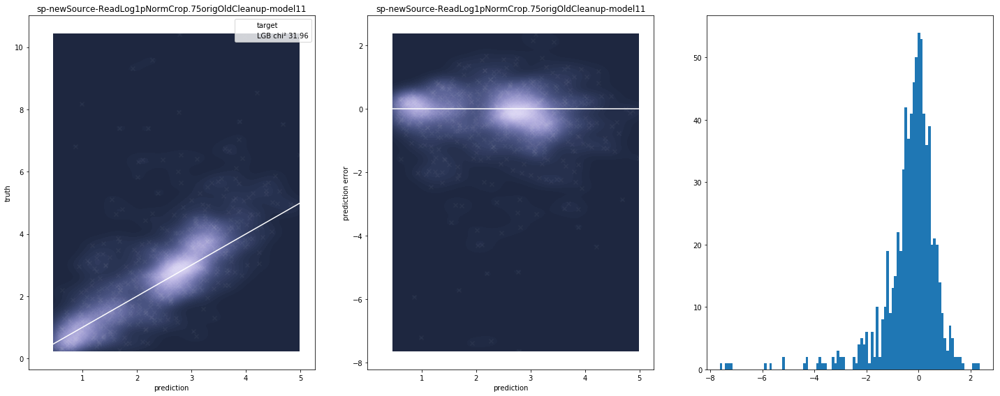

100%|██████████| 39/39 [16:59<00:00, 27.06s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.829739	training's Chi²: 72.5	valid_1's rmse: 0.940436	valid_1's Chi²: 94.4
[200]	training's rmse: 0.567526	training's Chi²: 33.9	valid_1's rmse: 0.757659	valid_1's Chi²: 61.2
[300]	training's rmse: 0.486575	training's Chi²: 24.9	valid_1's rmse: 0.71242	valid_1's Chi²: 54.1
[400]	training's rmse: 0.447544	training's Chi²: 21.1	valid_1's rmse: 0.693024	valid_1's Chi²: 51.2
[500]	training's rmse: 0.422312	training's Chi²: 18.8	valid_1's rmse: 0.683211	valid_1's Chi²: 49.8
[600]	training's rmse: 0.402392	training's Chi²: 17	valid_1's rmse: 0.676938	valid_1's Chi²: 48.9
[700]	training's rmse: 0.385583	training's Chi²: 15.7	valid_1's rmse: 0.673264	valid_1's Chi²: 48.4
[800]	training's rmse: 0.370927	training's Chi²: 14.5	valid_1's rmse: 0.670517	valid_1's Chi²: 48
[900]	training's rmse: 0.357848	training's Chi²: 13.5	valid_1's rmse: 0.669652	valid_1's Chi²: 47.8
Early stopping, best iteration is:
[865]	t

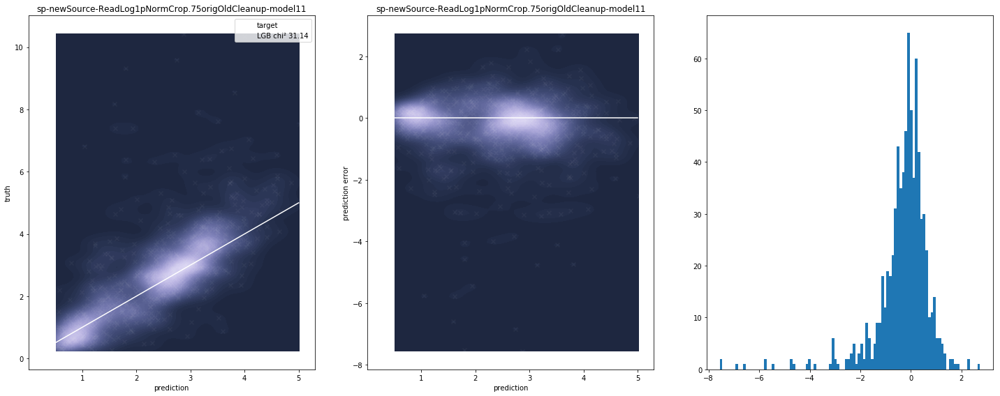

100%|██████████| 39/39 [16:26<00:00, 21.26s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.825589	training's Chi²: 71.8	valid_1's rmse: 0.918407	valid_1's Chi²: 90
[200]	training's rmse: 0.562556	training's Chi²: 33.3	valid_1's rmse: 0.732723	valid_1's Chi²: 57.3
[300]	training's rmse: 0.482542	training's Chi²: 24.5	valid_1's rmse: 0.679085	valid_1's Chi²: 49.2
[400]	training's rmse: 0.44435	training's Chi²: 20.8	valid_1's rmse: 0.66091	valid_1's Chi²: 46.6
[500]	training's rmse: 0.419106	training's Chi²: 18.5	valid_1's rmse: 0.655708	valid_1's Chi²: 45.9
Early stopping, best iteration is:
[480]	training's rmse: 0.423502	training's Chi²: 18.9	valid_1's rmse: 0.654836	valid_1's Chi²: 45.7
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.817514	training's Chi²: 71	valid_1's rmse: 1.06142	valid_1's Chi²: 113.5
[200]	training's rmse: 0.562425	training's Chi²: 33.6	valid_1's rmse: 0.852314	valid_1's Chi²: 73.2
[300]	training's rmse: 0.483161	training's Ch

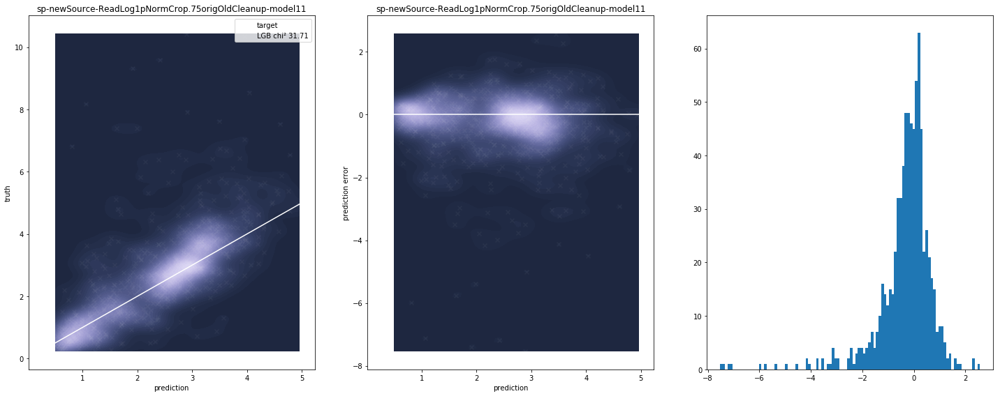

100%|██████████| 39/39 [16:02<00:00, 20.48s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.833002	training's Chi²: 73	valid_1's rmse: 0.931618	valid_1's Chi²: 92.6
[200]	training's rmse: 0.570907	training's Chi²: 34.3	valid_1's rmse: 0.755314	valid_1's Chi²: 60.9
[300]	training's rmse: 0.488273	training's Chi²: 25.1	valid_1's rmse: 0.698284	valid_1's Chi²: 52
[400]	training's rmse: 0.449018	training's Chi²: 21.2	valid_1's rmse: 0.684625	valid_1's Chi²: 50
[500]	training's rmse: 0.423323	training's Chi²: 18.9	valid_1's rmse: 0.674044	valid_1's Chi²: 48.5
[600]	training's rmse: 0.403658	training's Chi²: 17.2	valid_1's rmse: 0.671808	valid_1's Chi²: 48.1
[700]	training's rmse: 0.386791	training's Chi²: 15.7	valid_1's rmse: 0.669333	valid_1's Chi²: 47.8
[800]	training's rmse: 0.371846	training's Chi²: 14.6	valid_1's rmse: 0.668207	valid_1's Chi²: 47.6
Early stopping, best iteration is:
[799]	training's rmse: 0.37196	training's Chi²: 14.6	valid_1's rmse: 0.668242	valid_1's Chi²: 47.6
Training 

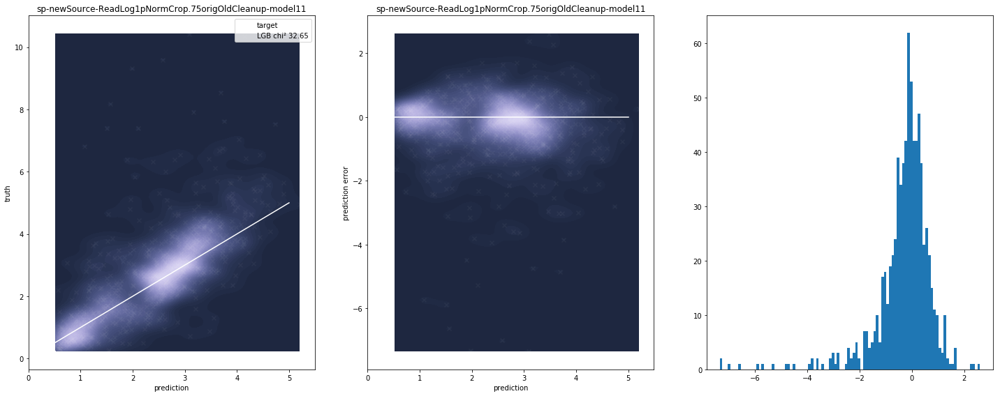

100%|██████████| 39/39 [16:46<00:00, 23.38s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.832508	training's Chi²: 73	valid_1's rmse: 0.910407	valid_1's Chi²: 88.4
[200]	training's rmse: 0.572229	training's Chi²: 34.5	valid_1's rmse: 0.723959	valid_1's Chi²: 55.9
[300]	training's rmse: 0.491644	training's Chi²: 25.4	valid_1's rmse: 0.667852	valid_1's Chi²: 47.6
[400]	training's rmse: 0.452486	training's Chi²: 21.6	valid_1's rmse: 0.647234	valid_1's Chi²: 44.7
[500]	training's rmse: 0.426328	training's Chi²: 19.1	valid_1's rmse: 0.641086	valid_1's Chi²: 43.8
[600]	training's rmse: 0.405895	training's Chi²: 17.3	valid_1's rmse: 0.634516	valid_1's Chi²: 43
[700]	training's rmse: 0.388752	training's Chi²: 15.9	valid_1's rmse: 0.632125	valid_1's Chi²: 42.6
[800]	training's rmse: 0.373835	training's Chi²: 14.7	valid_1's rmse: 0.631403	valid_1's Chi²: 42.5
[900]	training's rmse: 0.360465	training's Chi²: 13.7	valid_1's rmse: 0.630341	valid_1's Chi²: 42.4
Early stopping, best iteration is:
[822]	

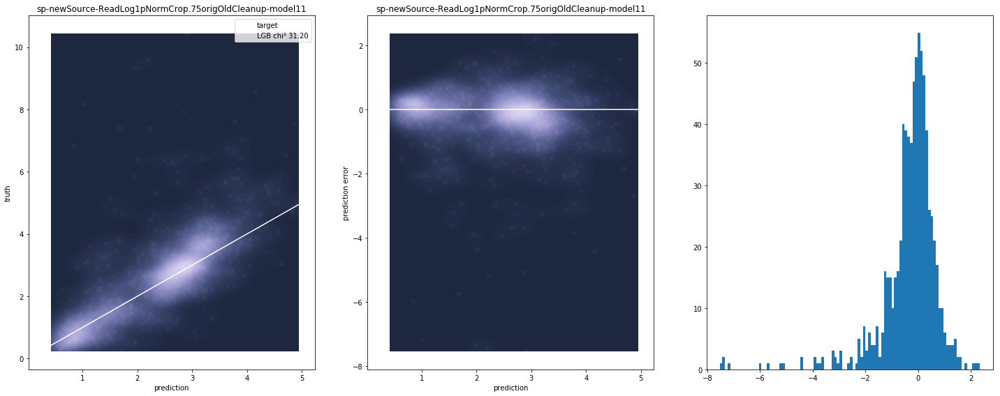

100%|██████████| 39/39 [16:16<00:00, 20.44s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.825589	training's Chi²: 71.8	valid_1's rmse: 0.918407	valid_1's Chi²: 90
[200]	training's rmse: 0.562556	training's Chi²: 33.3	valid_1's rmse: 0.732723	valid_1's Chi²: 57.3
[300]	training's rmse: 0.482542	training's Chi²: 24.5	valid_1's rmse: 0.679085	valid_1's Chi²: 49.2
[400]	training's rmse: 0.44435	training's Chi²: 20.8	valid_1's rmse: 0.66091	valid_1's Chi²: 46.6
[500]	training's rmse: 0.419106	training's Chi²: 18.5	valid_1's rmse: 0.655711	valid_1's Chi²: 45.9
Early stopping, best iteration is:
[480]	training's rmse: 0.423502	training's Chi²: 18.9	valid_1's rmse: 0.654836	valid_1's Chi²: 45.7
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.817514	training's Chi²: 71	valid_1's rmse: 1.06142	valid_1's Chi²: 113.5
[200]	training's rmse: 0.562425	training's Chi²: 33.6	valid_1's rmse: 0.852316	valid_1's Chi²: 73.2
[300]	training's rmse: 0.483161	training's Ch

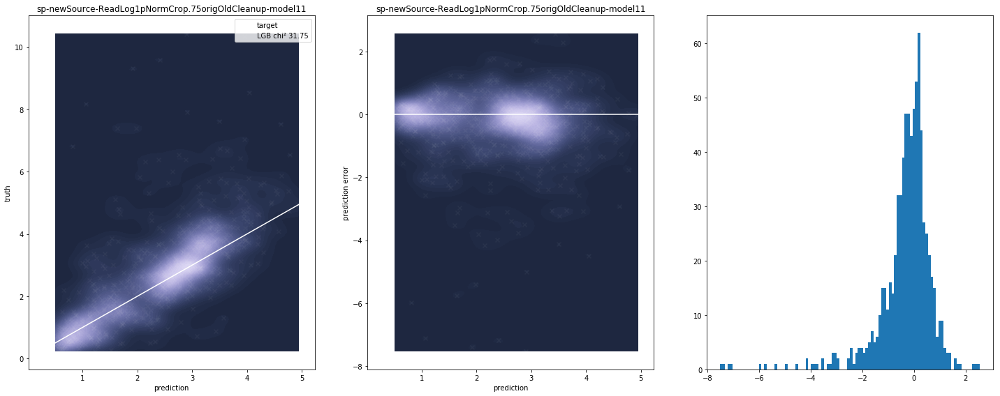

100%|██████████| 39/39 [16:13<00:00, 20.56s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.832508	training's Chi²: 73	valid_1's rmse: 0.910474	valid_1's Chi²: 88.4
[200]	training's rmse: 0.572229	training's Chi²: 34.5	valid_1's rmse: 0.723972	valid_1's Chi²: 55.9
[300]	training's rmse: 0.491644	training's Chi²: 25.4	valid_1's rmse: 0.667827	valid_1's Chi²: 47.6
[400]	training's rmse: 0.452486	training's Chi²: 21.6	valid_1's rmse: 0.647207	valid_1's Chi²: 44.7
[500]	training's rmse: 0.426328	training's Chi²: 19.1	valid_1's rmse: 0.641063	valid_1's Chi²: 43.8
[600]	training's rmse: 0.405895	training's Chi²: 17.3	valid_1's rmse: 0.634479	valid_1's Chi²: 42.9
[700]	training's rmse: 0.388752	training's Chi²: 15.9	valid_1's rmse: 0.632087	valid_1's Chi²: 42.6
[800]	training's rmse: 0.373835	training's Chi²: 14.7	valid_1's rmse: 0.631362	valid_1's Chi²: 42.5
[900]	training's rmse: 0.360465	training's Chi²: 13.7	valid_1's rmse: 0.630307	valid_1's Chi²: 42.4
Early stopping, best iteration is:
[808

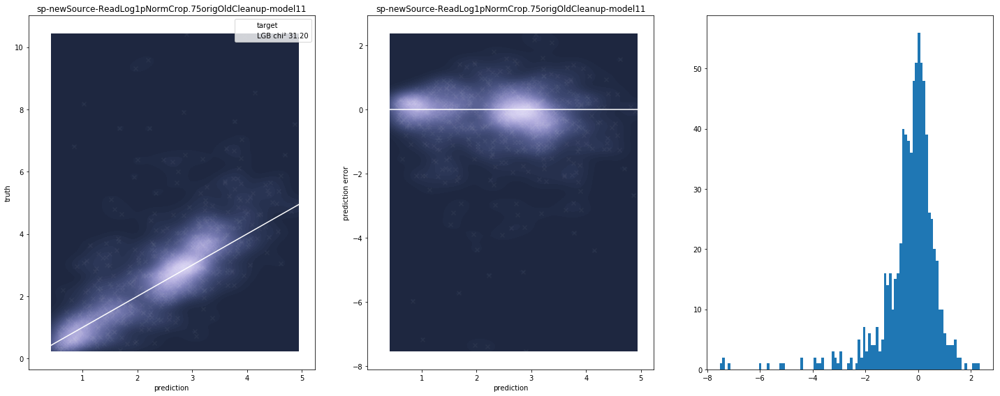

100%|██████████| 39/39 [09:39<00:00, 12.48s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.835778	training's Chi²: 73.5	valid_1's rmse: 0.921296	valid_1's Chi²: 90.5
[200]	training's rmse: 0.575451	training's Chi²: 34.9	valid_1's rmse: 0.744318	valid_1's Chi²: 59.1
[300]	training's rmse: 0.494933	training's Chi²: 25.8	valid_1's rmse: 0.691261	valid_1's Chi²: 51
[400]	training's rmse: 0.456679	training's Chi²: 22	valid_1's rmse: 0.673574	valid_1's Chi²: 48.4
[500]	training's rmse: 0.431097	training's Chi²: 19.6	valid_1's rmse: 0.667369	valid_1's Chi²: 47.5
[600]	training's rmse: 0.410907	training's Chi²: 17.8	valid_1's rmse: 0.667366	valid_1's Chi²: 47.5
Early stopping, best iteration is:
[515]	training's rmse: 0.4278	training's Chi²: 19.3	valid_1's rmse: 0.666856	valid_1's Chi²: 47.4
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.825903	training's Chi²: 72.5	valid_1's rmse: 1.10239	valid_1's Chi²: 122.4
[200]	training's rmse: 0.575251	training's Ch

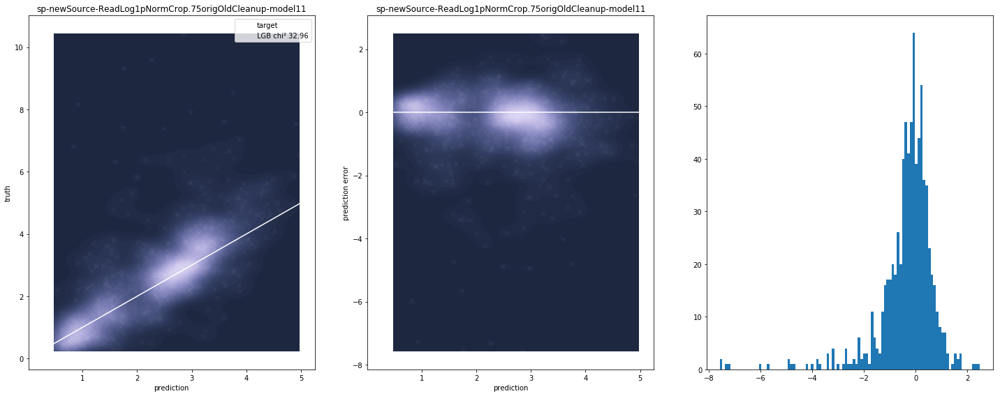

100%|██████████| 39/39 [16:21<00:00, 20.84s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.834809	training's Chi²: 73.4	valid_1's rmse: 0.924056	valid_1's Chi²: 91.1
[200]	training's rmse: 0.573582	training's Chi²: 34.6	valid_1's rmse: 0.739522	valid_1's Chi²: 58.3
[300]	training's rmse: 0.492792	training's Chi²: 25.6	valid_1's rmse: 0.687998	valid_1's Chi²: 50.5
[400]	training's rmse: 0.454569	training's Chi²: 21.8	valid_1's rmse: 0.669794	valid_1's Chi²: 47.9
[500]	training's rmse: 0.428943	training's Chi²: 19.4	valid_1's rmse: 0.664832	valid_1's Chi²: 47.2
Early stopping, best iteration is:
[490]	training's rmse: 0.431205	training's Chi²: 19.6	valid_1's rmse: 0.664796	valid_1's Chi²: 47.1
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.823999	training's Chi²: 72.1	valid_1's rmse: 1.11252	valid_1's Chi²: 124.7
[200]	training's rmse: 0.572981	training's Chi²: 34.9	valid_1's rmse: 0.909433	valid_1's Chi²: 83.3
[300]	training's rmse: 0.494193	trainin

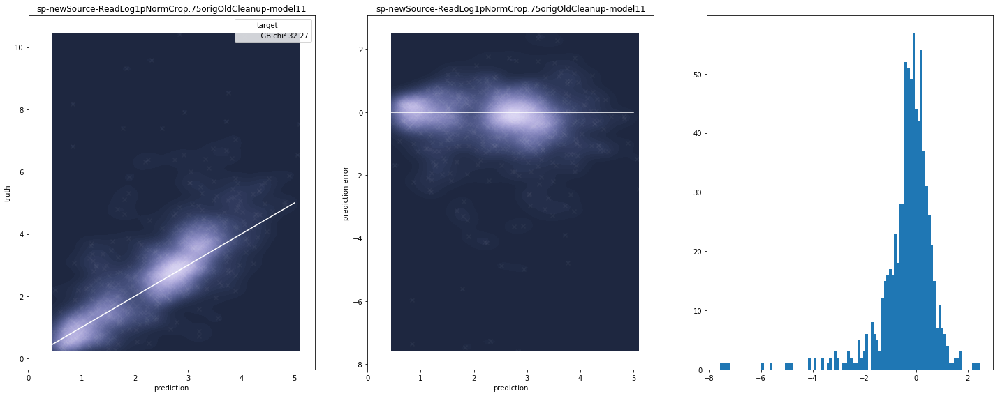

100%|██████████| 39/39 [09:47<00:00, 12.56s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.835589	training's Chi²: 73.5	valid_1's rmse: 0.923207	valid_1's Chi²: 90.9
[200]	training's rmse: 0.574672	training's Chi²: 34.8	valid_1's rmse: 0.742068	valid_1's Chi²: 58.7
[300]	training's rmse: 0.493651	training's Chi²: 25.7	valid_1's rmse: 0.692066	valid_1's Chi²: 51.1
[400]	training's rmse: 0.455639	training's Chi²: 21.9	valid_1's rmse: 0.673218	valid_1's Chi²: 48.3
[500]	training's rmse: 0.430183	training's Chi²: 19.5	valid_1's rmse: 0.670707	valid_1's Chi²: 48
Early stopping, best iteration is:
[475]	training's rmse: 0.435869	training's Chi²: 20	valid_1's rmse: 0.670363	valid_1's Chi²: 47.9
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.825795	training's Chi²: 72.5	valid_1's rmse: 1.10237	valid_1's Chi²: 122.4
[200]	training's rmse: 0.57533	training's Chi²: 35.2	valid_1's rmse: 0.926749	valid_1's Chi²: 86.5
[300]	training's rmse: 0.496457	training's C

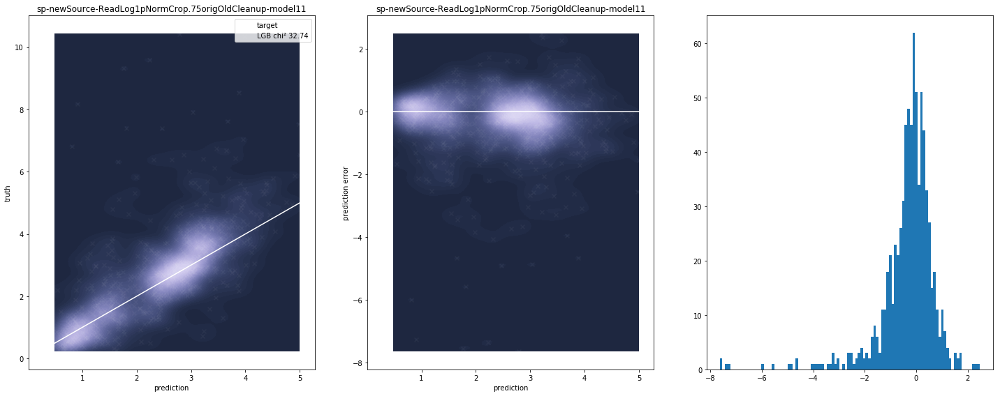

100%|██████████| 39/39 [09:40<00:00, 12.42s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.836067	training's Chi²: 73.6	valid_1's rmse: 0.916518	valid_1's Chi²: 89.6
[200]	training's rmse: 0.575701	training's Chi²: 34.9	valid_1's rmse: 0.735298	valid_1's Chi²: 57.7
[300]	training's rmse: 0.495057	training's Chi²: 25.8	valid_1's rmse: 0.690328	valid_1's Chi²: 50.8
[400]	training's rmse: 0.456176	training's Chi²: 21.9	valid_1's rmse: 0.673543	valid_1's Chi²: 48.4
[500]	training's rmse: 0.430307	training's Chi²: 19.5	valid_1's rmse: 0.669132	valid_1's Chi²: 47.8
Early stopping, best iteration is:
[497]	training's rmse: 0.43096	training's Chi²: 19.6	valid_1's rmse: 0.669006	valid_1's Chi²: 47.7
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.824731	training's Chi²: 72.3	valid_1's rmse: 1.11	valid_1's Chi²: 124.1
[200]	training's rmse: 0.573825	training's Chi²: 35	valid_1's rmse: 0.918041	valid_1's Chi²: 84.9
[300]	training's rmse: 0.495752	training's Ch

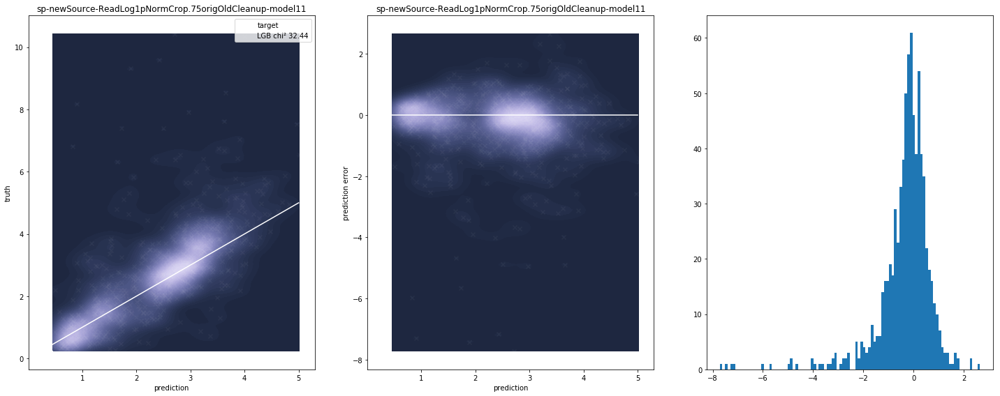

100%|██████████| 39/39 [15:56<00:00, 20.45s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.834076	training's Chi²: 73.2	valid_1's rmse: 0.928224	valid_1's Chi²: 91.9
[200]	training's rmse: 0.573122	training's Chi²: 34.6	valid_1's rmse: 0.746047	valid_1's Chi²: 59.4
[300]	training's rmse: 0.492809	training's Chi²: 25.6	valid_1's rmse: 0.699809	valid_1's Chi²: 52.2
[400]	training's rmse: 0.454249	training's Chi²: 21.7	valid_1's rmse: 0.679443	valid_1's Chi²: 49.2
[500]	training's rmse: 0.428357	training's Chi²: 19.3	valid_1's rmse: 0.674567	valid_1's Chi²: 48.5
Early stopping, best iteration is:
[482]	training's rmse: 0.432393	training's Chi²: 19.7	valid_1's rmse: 0.673765	valid_1's Chi²: 48.4
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.824045	training's Chi²: 72.2	valid_1's rmse: 1.12217	valid_1's Chi²: 126.9
[200]	training's rmse: 0.572572	training's Chi²: 34.8	valid_1's rmse: 0.938256	valid_1's Chi²: 88.7
[300]	training's rmse: 0.493808	trainin

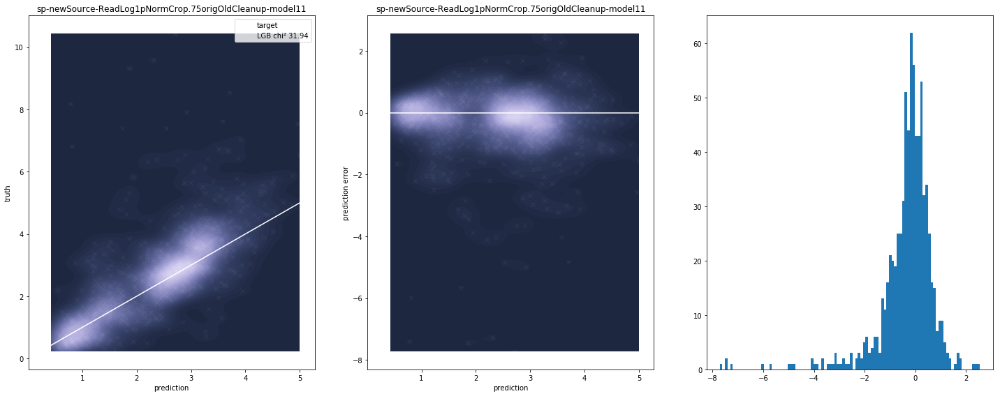

100%|██████████| 39/39 [18:25<00:00, 30.88s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.834388	training's Chi²: 73.3	valid_1's rmse: 0.925578	valid_1's Chi²: 91.4
[200]	training's rmse: 0.573643	training's Chi²: 34.6	valid_1's rmse: 0.743873	valid_1's Chi²: 59
[300]	training's rmse: 0.492783	training's Chi²: 25.6	valid_1's rmse: 0.696585	valid_1's Chi²: 51.8
[400]	training's rmse: 0.45404	training's Chi²: 21.7	valid_1's rmse: 0.675022	valid_1's Chi²: 48.6
[500]	training's rmse: 0.428398	training's Chi²: 19.3	valid_1's rmse: 0.669193	valid_1's Chi²: 47.8
Early stopping, best iteration is:
[471]	training's rmse: 0.435037	training's Chi²: 19.9	valid_1's rmse: 0.668895	valid_1's Chi²: 47.7
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.82376	training's Chi²: 72.1	valid_1's rmse: 1.12169	valid_1's Chi²: 126.8
[200]	training's rmse: 0.572546	training's Chi²: 34.8	valid_1's rmse: 0.92767	valid_1's Chi²: 86.7
[300]	training's rmse: 0.49394	training's Ch

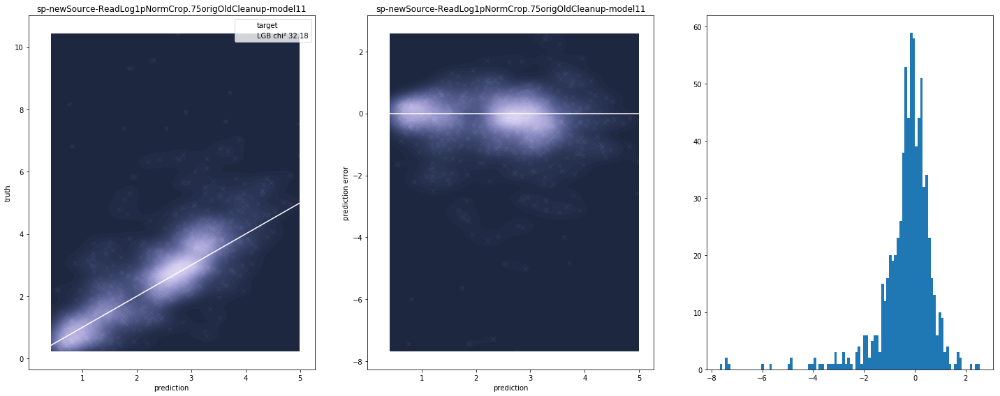

100%|██████████| 39/39 [09:26<00:00, 12.17s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.834549	training's Chi²: 73.3	valid_1's rmse: 0.925482	valid_1's Chi²: 91.4
[200]	training's rmse: 0.576293	training's Chi²: 35	valid_1's rmse: 0.734079	valid_1's Chi²: 57.5
[300]	training's rmse: 0.496105	training's Chi²: 25.9	valid_1's rmse: 0.685708	valid_1's Chi²: 50.2
[400]	training's rmse: 0.457688	training's Chi²: 22.1	valid_1's rmse: 0.667096	valid_1's Chi²: 47.5
[500]	training's rmse: 0.431701	training's Chi²: 19.6	valid_1's rmse: 0.662432	valid_1's Chi²: 46.8
[600]	training's rmse: 0.410928	training's Chi²: 17.8	valid_1's rmse: 0.65903	valid_1's Chi²: 46.3
Early stopping, best iteration is:
[589]	training's rmse: 0.413	training's Chi²: 18	valid_1's rmse: 0.658971	valid_1's Chi²: 46.3
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.821971	training's Chi²: 71.8	valid_1's rmse: 1.08285	valid_1's Chi²: 118.1
[200]	training's rmse: 0.57303	training's Chi²:

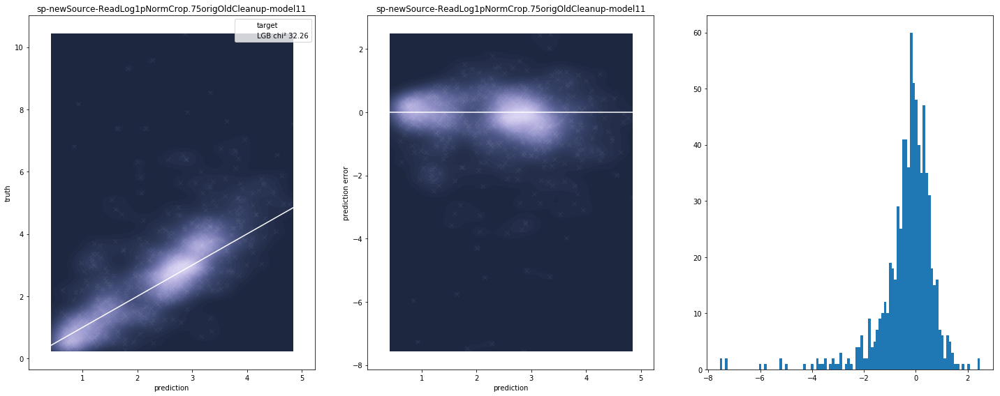

100%|██████████| 39/39 [16:05<00:00, 20.58s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.833241	training's Chi²: 73.1	valid_1's rmse: 0.924592	valid_1's Chi²: 91.2
[200]	training's rmse: 0.573708	training's Chi²: 34.6	valid_1's rmse: 0.737503	valid_1's Chi²: 58
[300]	training's rmse: 0.49363	training's Chi²: 25.7	valid_1's rmse: 0.686505	valid_1's Chi²: 50.3
[400]	training's rmse: 0.455281	training's Chi²: 21.8	valid_1's rmse: 0.671183	valid_1's Chi²: 48.1
[500]	training's rmse: 0.429909	training's Chi²: 19.5	valid_1's rmse: 0.662595	valid_1's Chi²: 46.8
[600]	training's rmse: 0.409269	training's Chi²: 17.6	valid_1's rmse: 0.659027	valid_1's Chi²: 46.3
Early stopping, best iteration is:
[595]	training's rmse: 0.410184	training's Chi²: 17.7	valid_1's rmse: 0.659094	valid_1's Chi²: 46.3
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.821061	training's Chi²: 71.6	valid_1's rmse: 1.09256	valid_1's Chi²: 120.3
[200]	training's rmse: 0.571446	training's

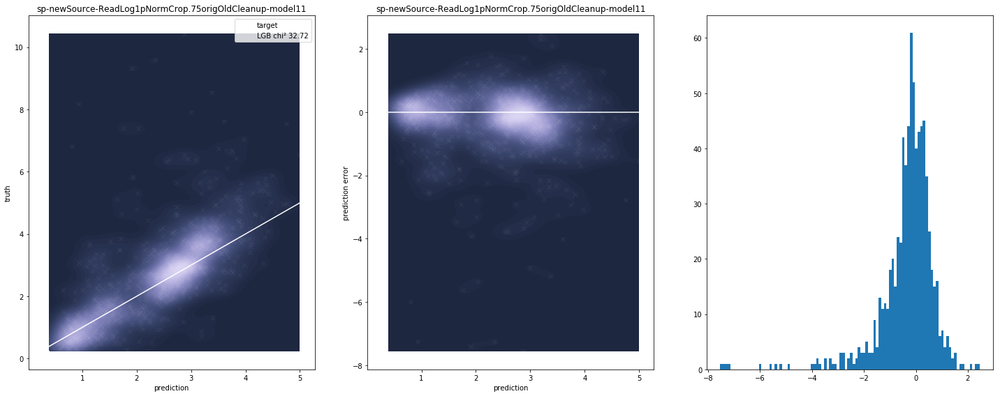

100%|██████████| 39/39 [09:30<00:00, 12.26s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.834398	training's Chi²: 73.3	valid_1's rmse: 0.912537	valid_1's Chi²: 88.8
[200]	training's rmse: 0.57637	training's Chi²: 35	valid_1's rmse: 0.723105	valid_1's Chi²: 55.8
[300]	training's rmse: 0.496977	training's Chi²: 26	valid_1's rmse: 0.670721	valid_1's Chi²: 48
[400]	training's rmse: 0.458232	training's Chi²: 22.1	valid_1's rmse: 0.650291	valid_1's Chi²: 45.1
[500]	training's rmse: 0.431869	training's Chi²: 19.6	valid_1's rmse: 0.644565	valid_1's Chi²: 44.3
[600]	training's rmse: 0.411029	training's Chi²: 17.8	valid_1's rmse: 0.643421	valid_1's Chi²: 44.2
Early stopping, best iteration is:
[589]	training's rmse: 0.41311	training's Chi²: 18	valid_1's rmse: 0.643285	valid_1's Chi²: 44.1
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.82166	training's Chi²: 71.7	valid_1's rmse: 1.08533	valid_1's Chi²: 118.7
[200]	training's rmse: 0.572596	training's Chi²: 3

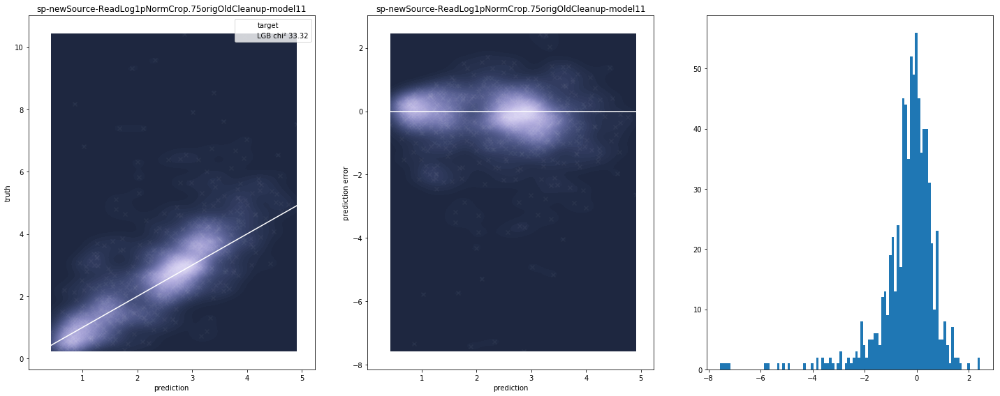

100%|██████████| 39/39 [09:39<00:00, 12.32s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.832481	training's Chi²: 73	valid_1's rmse: 0.923141	valid_1's Chi²: 90.9
[200]	training's rmse: 0.575099	training's Chi²: 34.8	valid_1's rmse: 0.739662	valid_1's Chi²: 58.4
[300]	training's rmse: 0.495029	training's Chi²: 25.8	valid_1's rmse: 0.682219	valid_1's Chi²: 49.7
[400]	training's rmse: 0.455455	training's Chi²: 21.8	valid_1's rmse: 0.665275	valid_1's Chi²: 47.2
[500]	training's rmse: 0.429086	training's Chi²: 19.4	valid_1's rmse: 0.658553	valid_1's Chi²: 46.3
[600]	training's rmse: 0.408337	training's Chi²: 17.6	valid_1's rmse: 0.658889	valid_1's Chi²: 46.3
Early stopping, best iteration is:
[512]	training's rmse: 0.426265	training's Chi²: 19.1	valid_1's rmse: 0.658383	valid_1's Chi²: 46.2
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.821858	training's Chi²: 71.8	valid_1's rmse: 1.07027	valid_1's Chi²: 115.4
[200]	training's rmse: 0.571205	training'

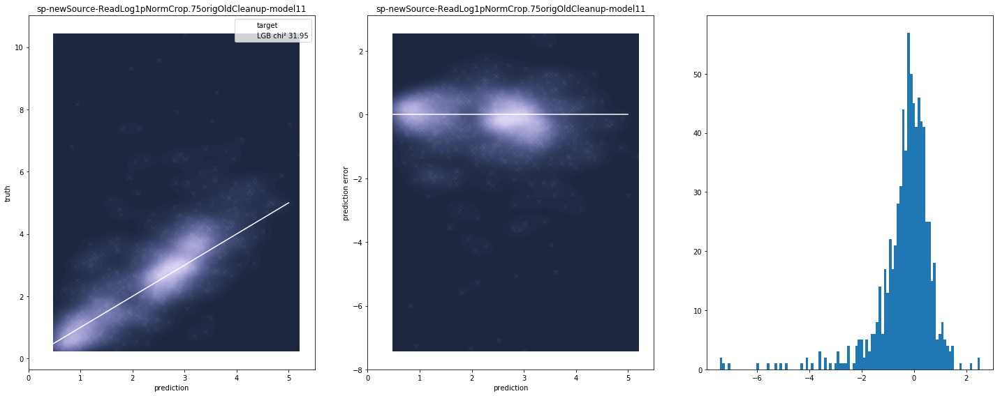

100%|██████████| 39/39 [18:24<00:00, 28.50s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.831639	training's Chi²: 72.8	valid_1's rmse: 0.919274	valid_1's Chi²: 90.2
[200]	training's rmse: 0.572232	training's Chi²: 34.5	valid_1's rmse: 0.732976	valid_1's Chi²: 57.3
[300]	training's rmse: 0.491888	training's Chi²: 25.5	valid_1's rmse: 0.679073	valid_1's Chi²: 49.2
[400]	training's rmse: 0.453383	training's Chi²: 21.6	valid_1's rmse: 0.657446	valid_1's Chi²: 46.1
[500]	training's rmse: 0.427159	training's Chi²: 19.2	valid_1's rmse: 0.652384	valid_1's Chi²: 45.4
Early stopping, best iteration is:
[437]	training's rmse: 0.442708	training's Chi²: 20.6	valid_1's rmse: 0.652701	valid_1's Chi²: 45.4
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.819762	training's Chi²: 71.4	valid_1's rmse: 1.07381	valid_1's Chi²: 116.2
[200]	training's rmse: 0.569015	training's Chi²: 34.4	valid_1's rmse: 0.840747	valid_1's Chi²: 71.2
[300]	training's rmse: 0.489973	trainin

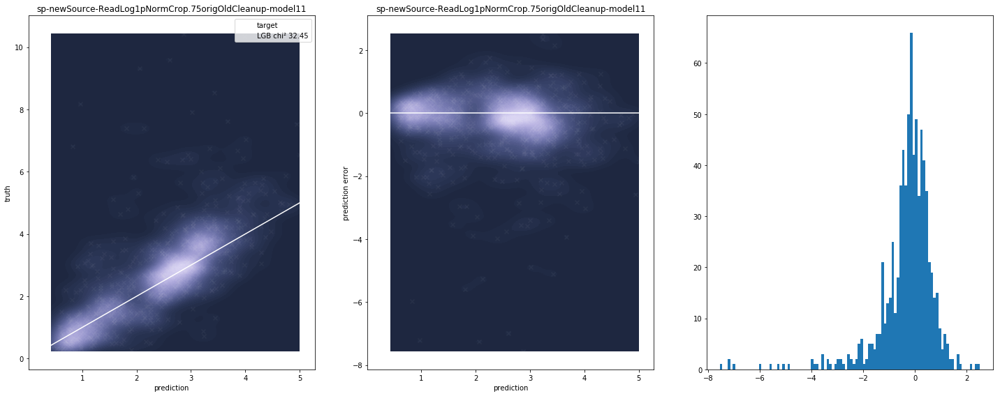

100%|██████████| 39/39 [16:12<00:00, 20.70s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.831639	training's Chi²: 72.8	valid_1's rmse: 0.919274	valid_1's Chi²: 90.2
[200]	training's rmse: 0.572232	training's Chi²: 34.5	valid_1's rmse: 0.732973	valid_1's Chi²: 57.3
[300]	training's rmse: 0.491927	training's Chi²: 25.5	valid_1's rmse: 0.679125	valid_1's Chi²: 49.2
[400]	training's rmse: 0.45323	training's Chi²: 21.6	valid_1's rmse: 0.658995	valid_1's Chi²: 46.3
[500]	training's rmse: 0.427083	training's Chi²: 19.2	valid_1's rmse: 0.65354	valid_1's Chi²: 45.6
[600]	training's rmse: 0.406361	training's Chi²: 17.4	valid_1's rmse: 0.652229	valid_1's Chi²: 45.4
Early stopping, best iteration is:
[582]	training's rmse: 0.409768	training's Chi²: 17.7	valid_1's rmse: 0.651981	valid_1's Chi²: 45.3
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.819762	training's Chi²: 71.4	valid_1's rmse: 1.07381	valid_1's Chi²: 116.2
[200]	training's rmse: 0.569067	training'

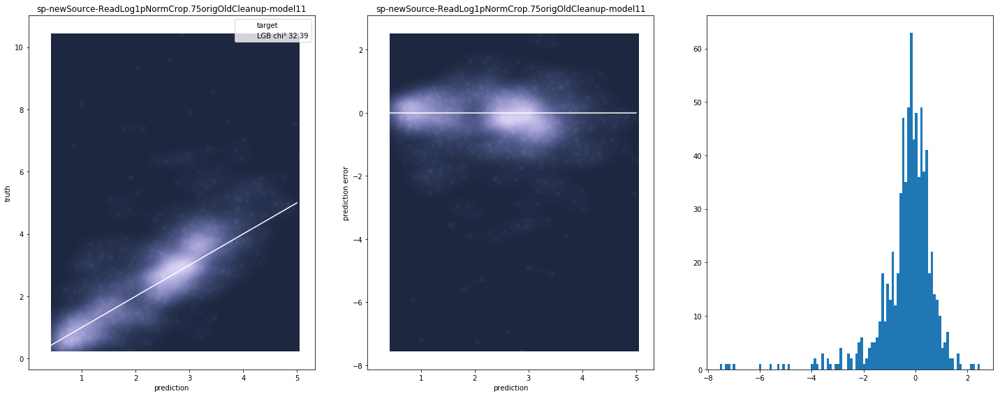

100%|██████████| 39/39 [09:27<00:00, 12.21s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.834355	training's Chi²: 73.3	valid_1's rmse: 0.922586	valid_1's Chi²: 90.8
[200]	training's rmse: 0.574589	training's Chi²: 34.8	valid_1's rmse: 0.742682	valid_1's Chi²: 58.8
[300]	training's rmse: 0.494951	training's Chi²: 25.8	valid_1's rmse: 0.691034	valid_1's Chi²: 50.9
[400]	training's rmse: 0.457194	training's Chi²: 22	valid_1's rmse: 0.671021	valid_1's Chi²: 48
[500]	training's rmse: 0.431525	training's Chi²: 19.6	valid_1's rmse: 0.664413	valid_1's Chi²: 47.1
[600]	training's rmse: 0.411317	training's Chi²: 17.8	valid_1's rmse: 0.662975	valid_1's Chi²: 46.9
Early stopping, best iteration is:
[582]	training's rmse: 0.414591	training's Chi²: 18.1	valid_1's rmse: 0.661963	valid_1's Chi²: 46.7
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.823778	training's Chi²: 72.1	valid_1's rmse: 1.11691	valid_1's Chi²: 125.7
[200]	training's rmse: 0.574044	training's 

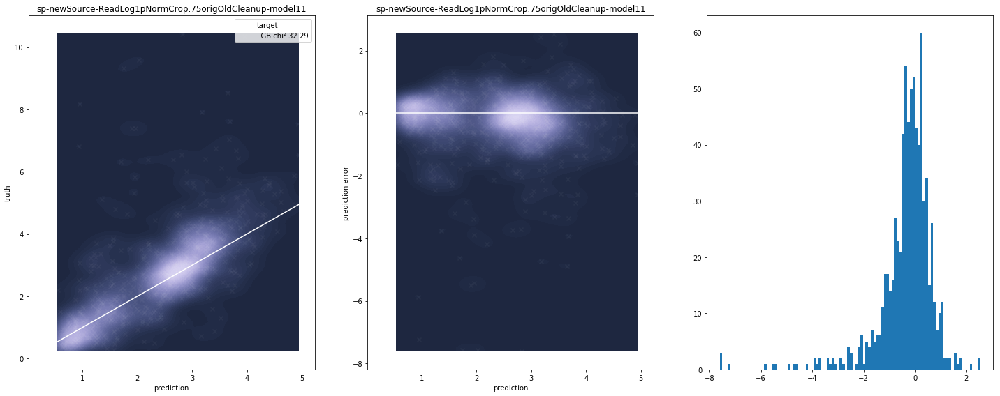

100%|██████████| 39/39 [10:01<00:00, 14.23s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.833503	training's Chi²: 73.1	valid_1's rmse: 0.929999	valid_1's Chi²: 92.3
[200]	training's rmse: 0.574401	training's Chi²: 34.7	valid_1's rmse: 0.751228	valid_1's Chi²: 60.2
[300]	training's rmse: 0.493739	training's Chi²: 25.7	valid_1's rmse: 0.700391	valid_1's Chi²: 52.3
[400]	training's rmse: 0.45507	training's Chi²: 21.8	valid_1's rmse: 0.679554	valid_1's Chi²: 49.3
[500]	training's rmse: 0.429311	training's Chi²: 19.4	valid_1's rmse: 0.677686	valid_1's Chi²: 49
[600]	training's rmse: 0.408783	training's Chi²: 17.6	valid_1's rmse: 0.67493	valid_1's Chi²: 48.6
[700]	training's rmse: 0.39147	training's Chi²: 16.1	valid_1's rmse: 0.675472	valid_1's Chi²: 48.7
Early stopping, best iteration is:
[628]	training's rmse: 0.403552	training's Chi²: 17.1	valid_1's rmse: 0.673769	valid_1's Chi²: 48.4
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.82336	training's Ch

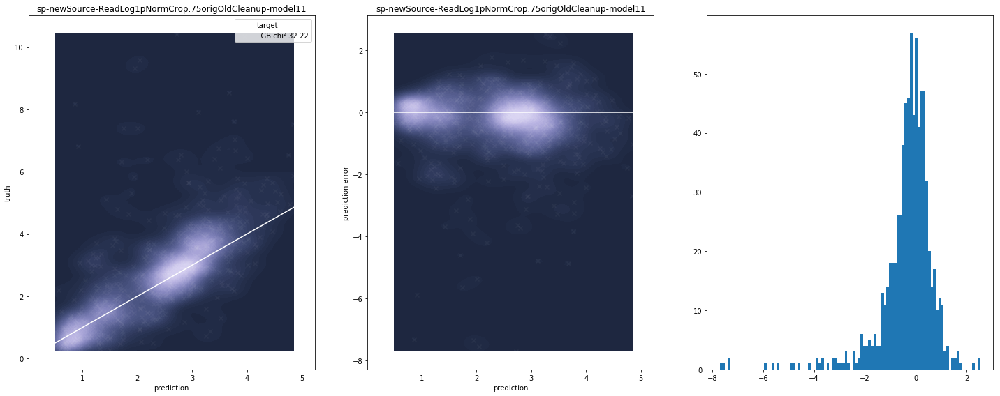

100%|██████████| 39/39 [09:29<00:00, 12.32s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.834614	training's Chi²: 73.3	valid_1's rmse: 0.912212	valid_1's Chi²: 88.8
[200]	training's rmse: 0.576699	training's Chi²: 35	valid_1's rmse: 0.726408	valid_1's Chi²: 56.3
[300]	training's rmse: 0.496991	training's Chi²: 26	valid_1's rmse: 0.674263	valid_1's Chi²: 48.5
[400]	training's rmse: 0.458125	training's Chi²: 22.1	valid_1's rmse: 0.654172	valid_1's Chi²: 45.7
[500]	training's rmse: 0.431684	training's Chi²: 19.6	valid_1's rmse: 0.647854	valid_1's Chi²: 44.8
[600]	training's rmse: 0.411086	training's Chi²: 17.8	valid_1's rmse: 0.643136	valid_1's Chi²: 44.1
[700]	training's rmse: 0.393893	training's Chi²: 16.3	valid_1's rmse: 0.641743	valid_1's Chi²: 43.9
Early stopping, best iteration is:
[697]	training's rmse: 0.39438	training's Chi²: 16.4	valid_1's rmse: 0.641804	valid_1's Chi²: 43.9
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.821944	training's C

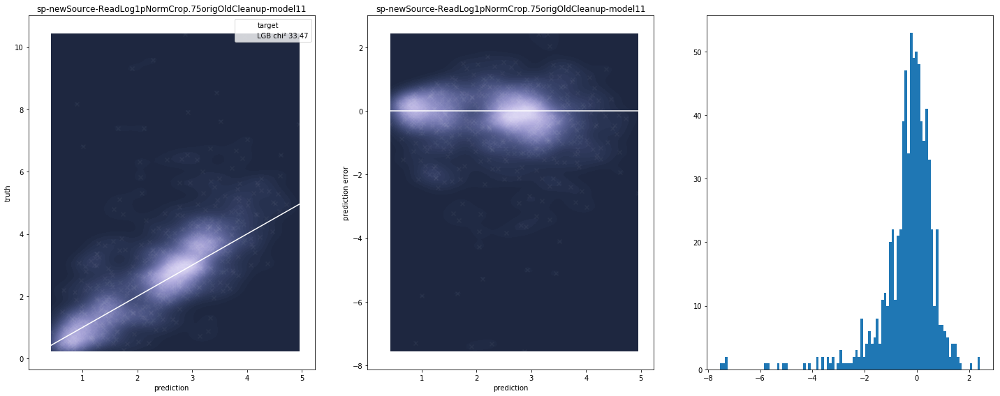

100%|██████████| 39/39 [09:43<00:00, 12.41s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.832507	training's Chi²: 73	valid_1's rmse: 0.915717	valid_1's Chi²: 89.5
[200]	training's rmse: 0.575503	training's Chi²: 34.9	valid_1's rmse: 0.725137	valid_1's Chi²: 56.1
[300]	training's rmse: 0.494854	training's Chi²: 25.8	valid_1's rmse: 0.670613	valid_1's Chi²: 48
[400]	training's rmse: 0.455677	training's Chi²: 21.9	valid_1's rmse: 0.654082	valid_1's Chi²: 45.6
[500]	training's rmse: 0.429651	training's Chi²: 19.4	valid_1's rmse: 0.64518	valid_1's Chi²: 44.4
[600]	training's rmse: 0.408972	training's Chi²: 17.6	valid_1's rmse: 0.641873	valid_1's Chi²: 44
Early stopping, best iteration is:
[586]	training's rmse: 0.411544	training's Chi²: 17.8	valid_1's rmse: 0.641834	valid_1's Chi²: 43.9
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.820984	training's Chi²: 71.6	valid_1's rmse: 1.08987	valid_1's Chi²: 119.7
[200]	training's rmse: 0.57051	training's Chi²

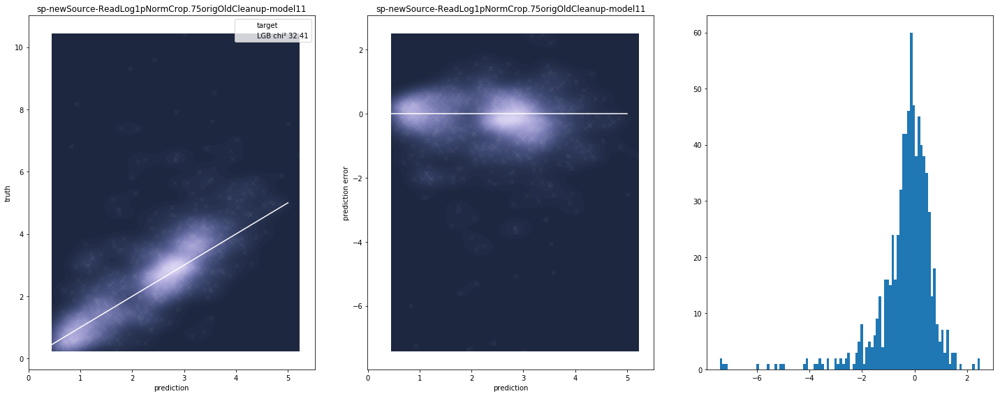

100%|██████████| 39/39 [10:05<00:00, 17.30s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.827002	training's Chi²: 72	valid_1's rmse: 0.919005	valid_1's Chi²: 90.1
[200]	training's rmse: 0.565737	training's Chi²: 33.7	valid_1's rmse: 0.733553	valid_1's Chi²: 57.4
[300]	training's rmse: 0.486462	training's Chi²: 24.9	valid_1's rmse: 0.686397	valid_1's Chi²: 50.3
[400]	training's rmse: 0.447623	training's Chi²: 21.1	valid_1's rmse: 0.669664	valid_1's Chi²: 47.8
[500]	training's rmse: 0.421865	training's Chi²: 18.7	valid_1's rmse: 0.663092	valid_1's Chi²: 46.9
[600]	training's rmse: 0.401505	training's Chi²: 17	valid_1's rmse: 0.658921	valid_1's Chi²: 46.3
[700]	training's rmse: 0.3843	training's Chi²: 15.5	valid_1's rmse: 0.658188	valid_1's Chi²: 46.2
Early stopping, best iteration is:
[658]	training's rmse: 0.391248	training's Chi²: 16.1	valid_1's rmse: 0.657621	valid_1's Chi²: 46.1
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.816594	training's Ch

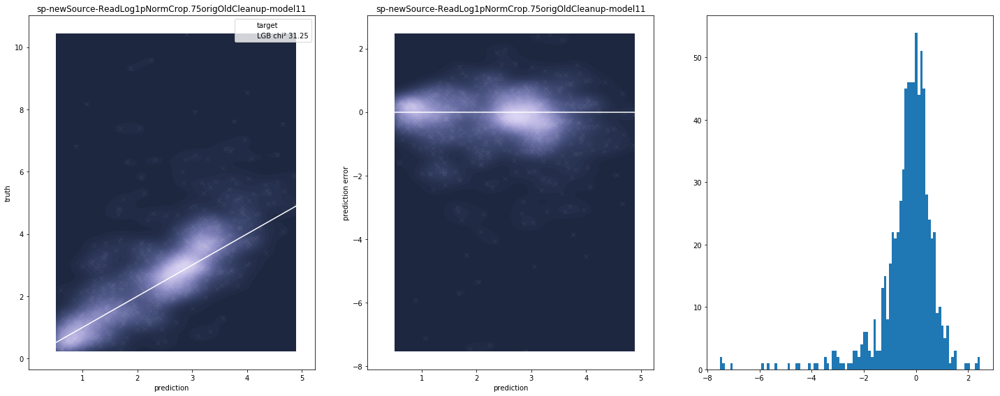

100%|██████████| 39/39 [09:40<00:00, 12.44s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.831682	training's Chi²: 72.8	valid_1's rmse: 0.913969	valid_1's Chi²: 89.1
[200]	training's rmse: 0.571655	training's Chi²: 34.4	valid_1's rmse: 0.73639	valid_1's Chi²: 57.8
[300]	training's rmse: 0.490938	training's Chi²: 25.4	valid_1's rmse: 0.678807	valid_1's Chi²: 49.2
[400]	training's rmse: 0.451456	training's Chi²: 21.5	valid_1's rmse: 0.655707	valid_1's Chi²: 45.9
[500]	training's rmse: 0.424915	training's Chi²: 19	valid_1's rmse: 0.644477	valid_1's Chi²: 44.3
[600]	training's rmse: 0.404189	training's Chi²: 17.2	valid_1's rmse: 0.638511	valid_1's Chi²: 43.5
[700]	training's rmse: 0.386816	training's Chi²: 15.8	valid_1's rmse: 0.635562	valid_1's Chi²: 43.1
[800]	training's rmse: 0.371441	training's Chi²: 14.5	valid_1's rmse: 0.636173	valid_1's Chi²: 43.2
Early stopping, best iteration is:
[708]	training's rmse: 0.385428	training's Chi²: 15.6	valid_1's rmse: 0.635061	valid_1's Chi²: 43
Trainin

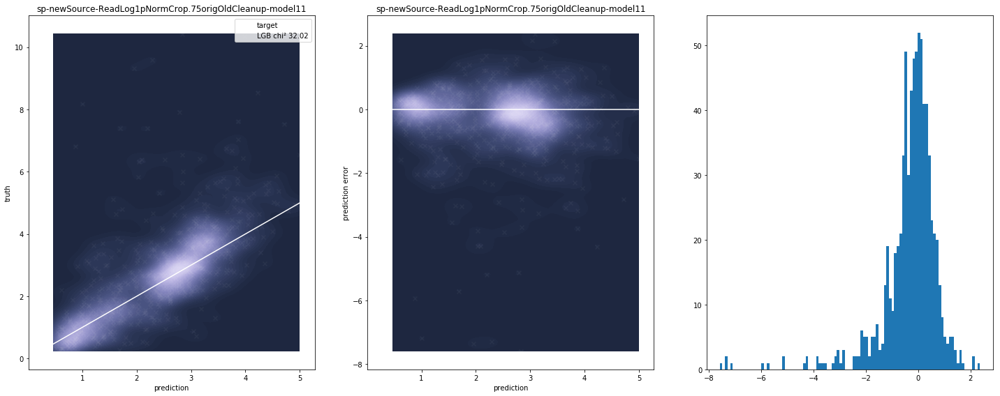

100%|██████████| 39/39 [16:01<00:00, 21.19s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.827121	training's Chi²: 72	valid_1's rmse: 0.916308	valid_1's Chi²: 89.6
[200]	training's rmse: 0.565401	training's Chi²: 33.7	valid_1's rmse: 0.732527	valid_1's Chi²: 57.2
[300]	training's rmse: 0.48572	training's Chi²: 24.8	valid_1's rmse: 0.684738	valid_1's Chi²: 50
[400]	training's rmse: 0.44724	training's Chi²: 21.1	valid_1's rmse: 0.666705	valid_1's Chi²: 47.4
[500]	training's rmse: 0.421302	training's Chi²: 18.7	valid_1's rmse: 0.658879	valid_1's Chi²: 46.3
[600]	training's rmse: 0.400976	training's Chi²: 16.9	valid_1's rmse: 0.658753	valid_1's Chi²: 46.3
Early stopping, best iteration is:
[559]	training's rmse: 0.408729	training's Chi²: 17.6	valid_1's rmse: 0.657658	valid_1's Chi²: 46.1
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.817097	training's Chi²: 70.9	valid_1's rmse: 1.0602	valid_1's Chi²: 113.2
[200]	training's rmse: 0.564037	training's Chi

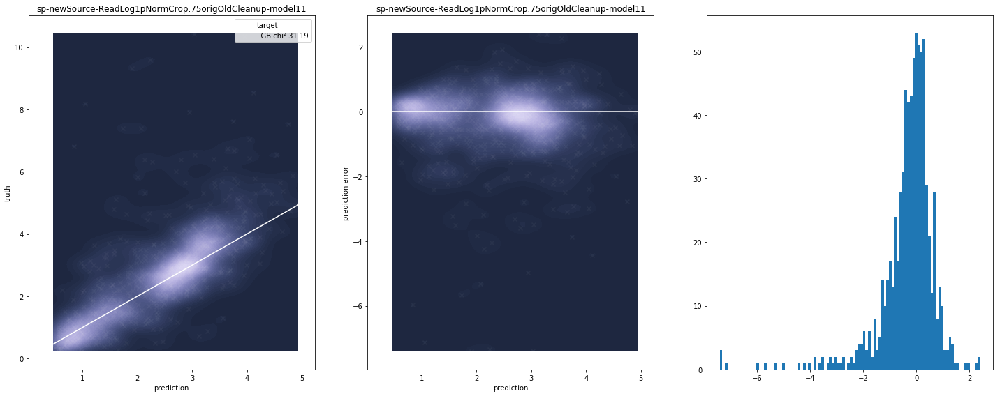

100%|██████████| 39/39 [20:36<00:00, 32.90s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.827121	training's Chi²: 72	valid_1's rmse: 0.916506	valid_1's Chi²: 89.6
[200]	training's rmse: 0.565401	training's Chi²: 33.7	valid_1's rmse: 0.732701	valid_1's Chi²: 57.3
[300]	training's rmse: 0.48572	training's Chi²: 24.8	valid_1's rmse: 0.684897	valid_1's Chi²: 50
[400]	training's rmse: 0.44724	training's Chi²: 21.1	valid_1's rmse: 0.666856	valid_1's Chi²: 47.4
[500]	training's rmse: 0.421302	training's Chi²: 18.7	valid_1's rmse: 0.659026	valid_1's Chi²: 46.3
[600]	training's rmse: 0.400976	training's Chi²: 16.9	valid_1's rmse: 0.658905	valid_1's Chi²: 46.3
Early stopping, best iteration is:
[514]	training's rmse: 0.418107	training's Chi²: 18.4	valid_1's rmse: 0.658435	valid_1's Chi²: 46.2
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.817097	training's Chi²: 70.9	valid_1's rmse: 1.06021	valid_1's Chi²: 113.2
[200]	training's rmse: 0.564037	training's Ch

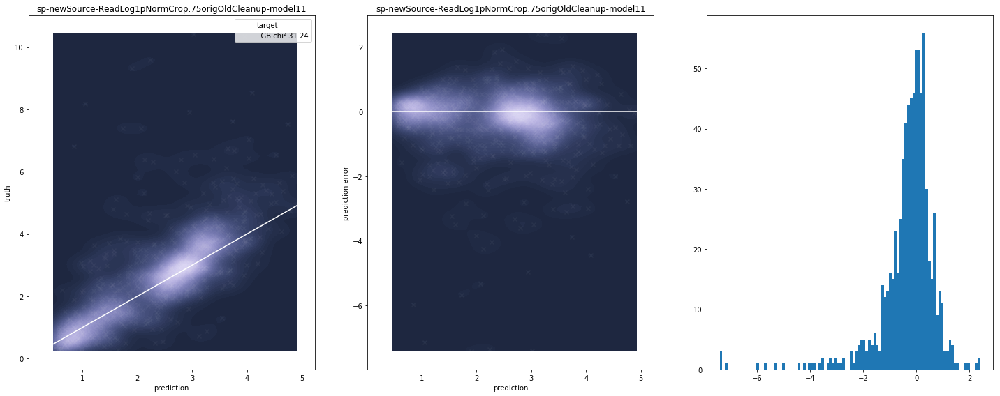

100%|██████████| 39/39 [15:59<00:00, 20.57s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.83251	training's Chi²: 73	valid_1's rmse: 0.910409	valid_1's Chi²: 88.4
[200]	training's rmse: 0.572323	training's Chi²: 34.5	valid_1's rmse: 0.722772	valid_1's Chi²: 55.7
[300]	training's rmse: 0.491683	training's Chi²: 25.4	valid_1's rmse: 0.66647	valid_1's Chi²: 47.4
[400]	training's rmse: 0.452321	training's Chi²: 21.5	valid_1's rmse: 0.647798	valid_1's Chi²: 44.8
[500]	training's rmse: 0.425874	training's Chi²: 19.1	valid_1's rmse: 0.641371	valid_1's Chi²: 43.9
[600]	training's rmse: 0.405504	training's Chi²: 17.3	valid_1's rmse: 0.635457	valid_1's Chi²: 43.1
[700]	training's rmse: 0.38817	training's Chi²: 15.9	valid_1's rmse: 0.633094	valid_1's Chi²: 42.8
[800]	training's rmse: 0.373347	training's Chi²: 14.7	valid_1's rmse: 0.63078	valid_1's Chi²: 42.4
Early stopping, best iteration is:
[785]	training's rmse: 0.375483	training's Chi²: 14.8	valid_1's rmse: 0.630691	valid_1's Chi²: 42.4
Training

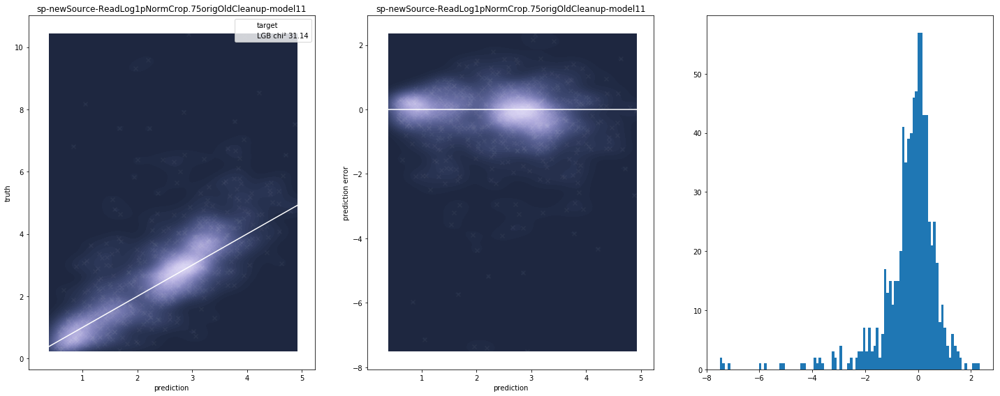

100%|██████████| 39/39 [16:25<00:00, 24.41s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.83251	training's Chi²: 73	valid_1's rmse: 0.910409	valid_1's Chi²: 88.4
[200]	training's rmse: 0.572323	training's Chi²: 34.5	valid_1's rmse: 0.722771	valid_1's Chi²: 55.7
[300]	training's rmse: 0.491683	training's Chi²: 25.4	valid_1's rmse: 0.666463	valid_1's Chi²: 47.4
[400]	training's rmse: 0.452321	training's Chi²: 21.5	valid_1's rmse: 0.647794	valid_1's Chi²: 44.8
[500]	training's rmse: 0.425874	training's Chi²: 19.1	valid_1's rmse: 0.641368	valid_1's Chi²: 43.9
[600]	training's rmse: 0.405504	training's Chi²: 17.3	valid_1's rmse: 0.635455	valid_1's Chi²: 43.1
[700]	training's rmse: 0.38817	training's Chi²: 15.9	valid_1's rmse: 0.633092	valid_1's Chi²: 42.8
[800]	training's rmse: 0.373347	training's Chi²: 14.7	valid_1's rmse: 0.630778	valid_1's Chi²: 42.4
Early stopping, best iteration is:
[785]	training's rmse: 0.375483	training's Chi²: 14.8	valid_1's rmse: 0.630689	valid_1's Chi²: 42.4
Traini

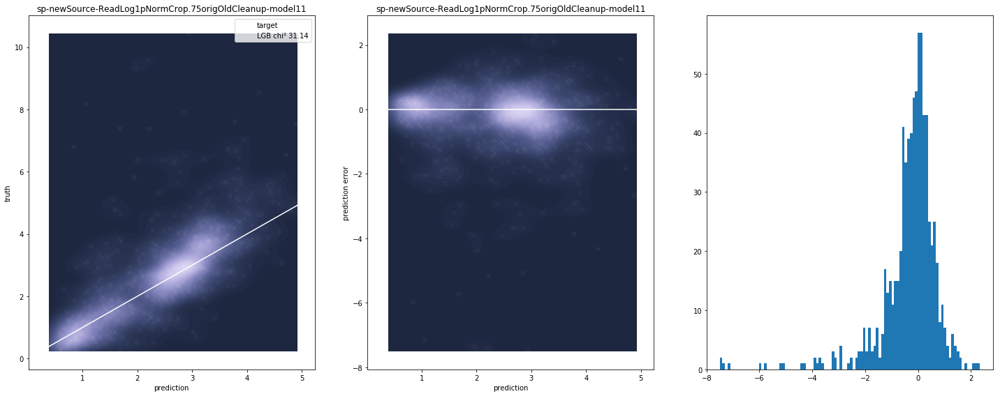

100%|██████████| 39/39 [16:27<00:00, 21.36s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.827121	training's Chi²: 72	valid_1's rmse: 0.9167	valid_1's Chi²: 89.6
[200]	training's rmse: 0.565401	training's Chi²: 33.7	valid_1's rmse: 0.73287	valid_1's Chi²: 57.3
[300]	training's rmse: 0.48572	training's Chi²: 24.8	valid_1's rmse: 0.685049	valid_1's Chi²: 50.1
[400]	training's rmse: 0.44724	training's Chi²: 21.1	valid_1's rmse: 0.667001	valid_1's Chi²: 47.5
[500]	training's rmse: 0.421302	training's Chi²: 18.7	valid_1's rmse: 0.659165	valid_1's Chi²: 46.4
[600]	training's rmse: 0.400976	training's Chi²: 16.9	valid_1's rmse: 0.659051	valid_1's Chi²: 46.3
Early stopping, best iteration is:
[517]	training's rmse: 0.417427	training's Chi²: 18.3	valid_1's rmse: 0.658402	valid_1's Chi²: 46.2
Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.817097	training's Chi²: 70.9	valid_1's rmse: 1.0602	valid_1's Chi²: 113.2
[200]	training's rmse: 0.564037	training's Chi²

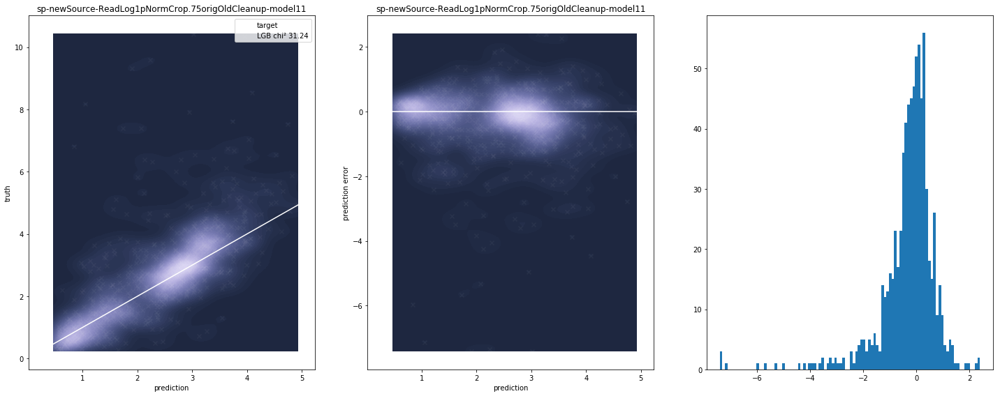

100%|██████████| 39/39 [16:00<00:00, 20.48s/it]


Training until validation scores don't improve for 100 rounds.
[100]	training's rmse: 0.83251	training's Chi²: 73	valid_1's rmse: 0.910411	valid_1's Chi²: 88.4
[200]	training's rmse: 0.572323	training's Chi²: 34.5	valid_1's rmse: 0.722772	valid_1's Chi²: 55.7
[300]	training's rmse: 0.491683	training's Chi²: 25.4	valid_1's rmse: 0.666466	valid_1's Chi²: 47.4
[400]	training's rmse: 0.452321	training's Chi²: 21.5	valid_1's rmse: 0.647793	valid_1's Chi²: 44.8
[500]	training's rmse: 0.425874	training's Chi²: 19.1	valid_1's rmse: 0.641368	valid_1's Chi²: 43.9
[600]	training's rmse: 0.405504	training's Chi²: 17.3	valid_1's rmse: 0.635454	valid_1's Chi²: 43.1
[700]	training's rmse: 0.38817	training's Chi²: 15.9	valid_1's rmse: 0.633091	valid_1's Chi²: 42.8
[800]	training's rmse: 0.373347	training's Chi²: 14.7	valid_1's rmse: 0.630776	valid_1's Chi²: 42.4
Early stopping, best iteration is:
[785]	training's rmse: 0.375483	training's Chi²: 14.8	valid_1's rmse: 0.630687	valid_1's Chi²: 42.4
Traini

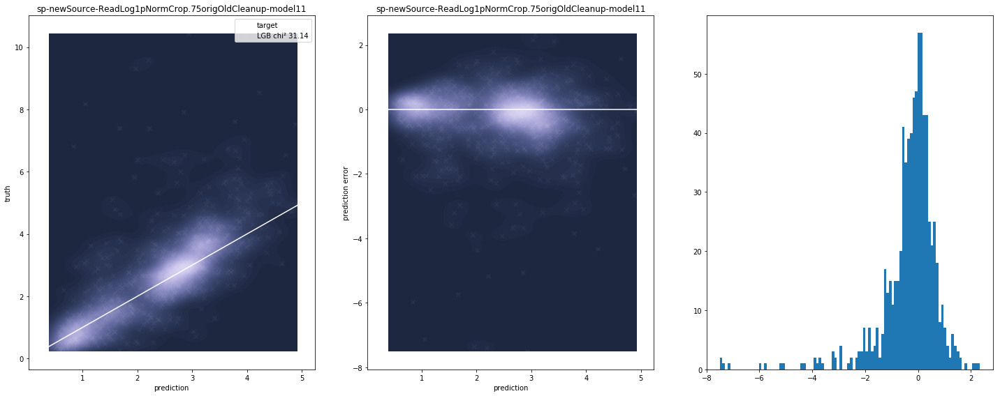

loaded


In [18]:
allPredictions = np.zeros([numPreprocessing,nSplits,N-M])


data[TRAIN+FEATURES] = np.ones([0,numFeatures])
data[TRAIN+TRUTH] = np.ones([0])
data[TRAIN+ERROR] = np.ones([0])
data[TRAIN+LINERROR] = np.ones([0])
data[TEST+FEATURES] = np.ones([0,numFeatures])
data[TEST+TRUTH] = np.ones([0])
data[TEST+ERROR] = np.ones([0])
data[TEST+LINERROR] = np.ones([0])


data[ID] = ids

curPreprocNum = 0
for curPreproc in preProcessingIterations:
    a, Xg3fNames = getFeatures(list(curPreproc) + [PP_NORMALIZE,0])

    data[TRAIN+FEATURES] = a[:M]
    data[TRAIN+TRUTH] = Y[:M]
    data[TRAIN+ERROR] = err[:M]
    data[TRAIN+LINERROR] = err_lin[:M]

    data[TEST+FEATURES] = a[M:]
    data[TEST+TRUTH] = Y[M:]
    data[TEST+ERROR] = err[M:]
    data[TEST+LINERROR]  = err_lin[M:]
    
    models, cvtrainpreds = getLGBMModelsWithCV(data[TRAIN+FEATURES], data[TRAIN+TRUTH], data[TRAIN+ERROR], data[TRAIN+LINERROR])

    ppreds = np.zeros([len(models),data[TEST+FEATURES].shape[0]])
    for i, m in zip(range(len(models)),models):
        mp = m.predict(data[TEST+FEATURES])
        ppreds[i] = mp
        allPredictions[curPreprocNum, i] = mp

    cvpred = ppreds.mean(axis=0)
    
    mpred = cvpred
    linChiSq = xi2(mpred, data[TEST+TRUTH], data[TEST+ERROR])
    print("Iteration : {} x²{}".format(curPreproc, linChiSq))
    for i in range(ppreds.shape[0]):
        xxx = xi2(ppreds[i], data[TEST+TRUTH], data[TEST+ERROR])
        print("Iteration : {} fold {} x²{}".format(curPreproc, i, xxx))

    # cmap = sns.cubehelix_palette(as_cmap=True, dark=0, light=1, reverse=True)
    cmap = sns.cubehelix_palette(as_cmap=True, start=2.8, rot=.1, reverse=True)
    plt.figure(figsize=(20,8))
    plt.subplot(131)
    plt.title(prefixThisRound)
    sns.kdeplot(mpred, data[TEST+TRUTH], alpha=1, cmap=cmap, shade=True, bw=0.2, cut=0, n_levels=60, label='LGB chi² {:.2f}'.format(linChiSq) )
    plt.scatter(x=mpred, y=data[TEST+TRUTH], alpha=0.04, c='w', marker='x', label='LGB chi² {:.2f}'.format(linChiSq) )
    plt.plot([0.25,5],[0.25,5], c='w', label='target')
    plt.xlabel('prediction')
    plt.ylabel('truth')
    plt.legend()
    plt.subplot(132)
    plt.title(prefixThisRound)
    sns.kdeplot(mpred, mpred-data[TEST+TRUTH], alpha=1, cmap=cmap, shade=True, bw=0.2, cut=0, n_levels=60, label='LGB chi² {:.2f}'.format(linChiSq) )
    plt.scatter(x=mpred, y=mpred-data[TEST+TRUTH], alpha=0.04, c='w', marker='x', label='LGB chi² {:.2f}'.format(linChiSq) )
    plt.plot([0.25,5],[0,0], c='w', label='target')
    plt.xlabel('prediction')
    plt.ylabel('prediction error')
    plt.subplot(133)
    plt.hist(mpred-data[TEST+TRUTH], bins=100)
    plt.tight_layout()
    plt.show()
    curPreprocNum = curPreprocNum+1

print("loaded")

Iteration : () x²33.75660505805524
Iteration : () fold 0 x²34.56726532521204
Iteration : () fold 1 x²35.068436709262826
Iteration : () fold 2 x²35.319840901003325
Iteration : () fold 3 x²34.63999018964736
Iteration : () fold 4 x²34.51661978325929
Iteration : () fold 5 x²34.862047324976345
Iteration : () fold 6 x²34.17222027321289
Iteration : (8,) x²33.79978639719332
Iteration : (8,) fold 0 x²34.1023292913199
Iteration : (8,) fold 1 x²35.092918456482096
Iteration : (8,) fold 2 x²35.63094050818629
Iteration : (8,) fold 3 x²35.04591119110195
Iteration : (8,) fold 4 x²34.963575801271276
Iteration : (8,) fold 5 x²34.71924875324952
Iteration : (8,) fold 6 x²33.95252754864059
Iteration : (16,) x²33.42011213567558
Iteration : (16,) fold 0 x²33.60830790314818
Iteration : (16,) fold 1 x²34.44689372223516
Iteration : (16,) fold 2 x²34.60579054447717
Iteration : (16,) fold 3 x²34.851828638656336
Iteration : (16,) fold 4 x²35.604565199031136
Iteration : (16,) fold 5 x²34.23489615292983
Iteration : 

1

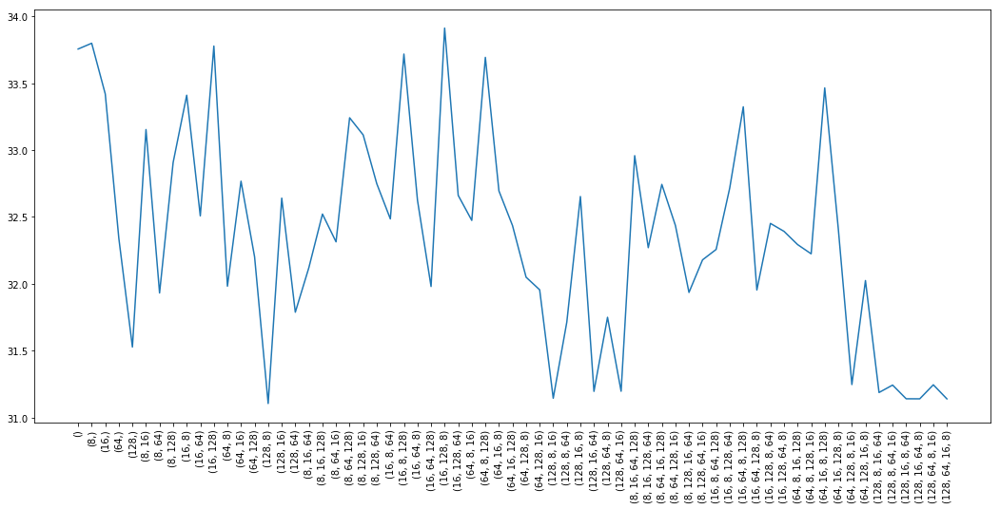

In [ ]:
texts = [str(i).replace("("," ").replace(")","").replace(" 8"," SCALE").replace(" 64"," CROP").replace(" 16"," LOG1P").replace(" 128"," CLEAN") for i in preProcessingIterations]

In [30]:
texts

[' ',
 ' SCALE,',
 ' LOG1P,',
 ' CROP,',
 ' CLEAN,',
 ' SCALE, LOG1P',
 ' SCALE, CROP',
 ' SCALE, CLEAN',
 ' LOG1P, SCALE',
 ' LOG1P, CROP',
 ' LOG1P, CLEAN',
 ' CROP, SCALE',
 ' CROP, LOG1P',
 ' CROP, CLEAN',
 ' CLEAN, SCALE',
 ' CLEAN, LOG1P',
 ' CLEAN, CROP',
 ' SCALE, LOG1P, CROP',
 ' SCALE, LOG1P, CLEAN',
 ' SCALE, CROP, LOG1P',
 ' SCALE, CROP, CLEAN',
 ' SCALE, CLEAN, LOG1P',
 ' SCALE, CLEAN, CROP',
 ' LOG1P, SCALE, CROP',
 ' LOG1P, SCALE, CLEAN',
 ' LOG1P, CROP, SCALE',
 ' LOG1P, CROP, CLEAN',
 ' LOG1P, CLEAN, SCALE',
 ' LOG1P, CLEAN, CROP',
 ' CROP, SCALE, LOG1P',
 ' CROP, SCALE, CLEAN',
 ' CROP, LOG1P, SCALE',
 ' CROP, LOG1P, CLEAN',
 ' CROP, CLEAN, SCALE',
 ' CROP, CLEAN, LOG1P',
 ' CLEAN, SCALE, LOG1P',
 ' CLEAN, SCALE, CROP',
 ' CLEAN, LOG1P, SCALE',
 ' CLEAN, LOG1P, CROP',
 ' CLEAN, CROP, SCALE',
 ' CLEAN, CROP, LOG1P',
 ' SCALE, LOG1P, CROP, CLEAN',
 ' SCALE, LOG1P, CLEAN, CROP',
 ' SCALE, CROP, LOG1P, CLEAN',
 ' SCALE, CROP, CLEAN, LOG1P',
 ' SCALE, CLEAN, LOG1P, CROP',


Iteration : () x²33.75660505805524
Iteration : () fold 0 x²34.56726532521204
Iteration : () fold 1 x²35.068436709262826
Iteration : () fold 2 x²35.319840901003325
Iteration : () fold 3 x²34.63999018964736
Iteration : () fold 4 x²34.51661978325929
Iteration : () fold 5 x²34.862047324976345
Iteration : () fold 6 x²34.17222027321289
Iteration : (8,) x²33.79978639719332
Iteration : (8,) fold 0 x²34.1023292913199
Iteration : (8,) fold 1 x²35.092918456482096
Iteration : (8,) fold 2 x²35.63094050818629
Iteration : (8,) fold 3 x²35.04591119110195
Iteration : (8,) fold 4 x²34.963575801271276
Iteration : (8,) fold 5 x²34.71924875324952
Iteration : (8,) fold 6 x²33.95252754864059
Iteration : (16,) x²33.42011213567558
Iteration : (16,) fold 0 x²33.60830790314818
Iteration : (16,) fold 1 x²34.44689372223516
Iteration : (16,) fold 2 x²34.60579054447717
Iteration : (16,) fold 3 x²34.851828638656336
Iteration : (16,) fold 4 x²35.604565199031136
Iteration : (16,) fold 5 x²34.23489615292983
Iteration : 

1

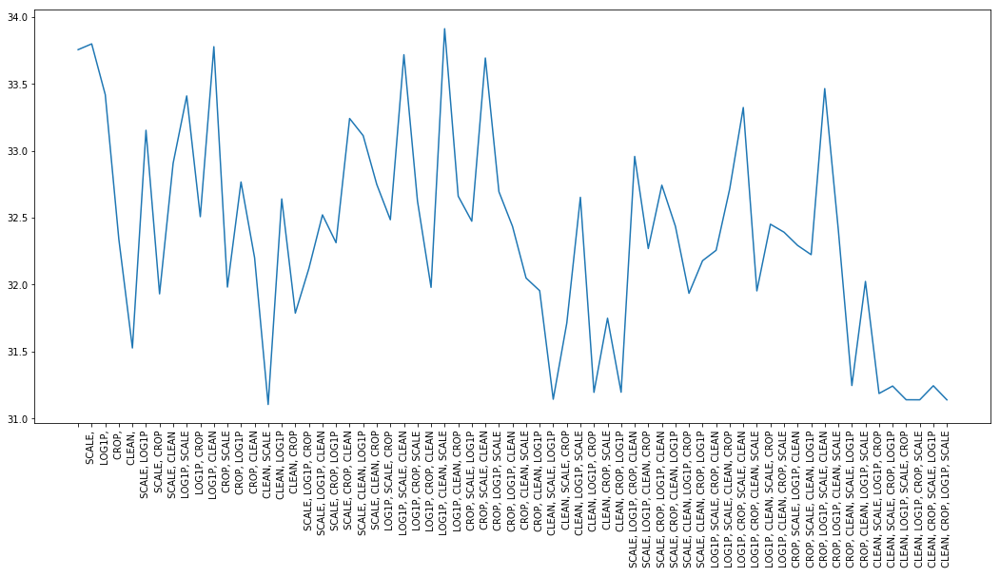

In [36]:
xi2s = []
foldXi2s = np.zeros([65,7])

for x in range(allPredictions.shape[0]):
    ppreds = allPredictions[x]
    curPreproc = preProcessingIterations[x]
    cvpred = ppreds.mean(axis=0)
    
    mpred = cvpred
    linChiSq = xi2(mpred, data[TEST+TRUTH], data[TEST+ERROR])
    print("Iteration : {} x²{}".format(curPreproc, linChiSq))
    
    xi2s.append(linChiSq)
    for i in range(ppreds.shape[0]):
        xxx = xi2(ppreds[i], data[TEST+TRUTH], data[TEST+ERROR])
        print("Iteration : {} fold {} x²{}".format(curPreproc, i, xxx))
        foldXi2s[x,i] = xxx
        
plt.figure(figsize=(18,8))
ax = plt.subplot(111)
plt.plot(xi2s)
plt.xticks(list(range(len(xi2s))), texts[:len(xi2s)], rotation='vertical')

1

In [20]:

print(preProcessingIterations[np.argmin(xi2s)])

(128, 8)


In [47]:
ddf = pd.DataFrame(data=foldXi2s.T)

In [115]:
texts[0] = 'nothing'
safexi2 = xi2s
xi2s.shape

(65,)

In [113]:
xi2s = np.array(xi2s)

colors = ['k' for x in xi2s]

for i in range(len(xi2s)):
    if xi2s[i] < 31.2:
        colors[i] = 'r'

# colors

1

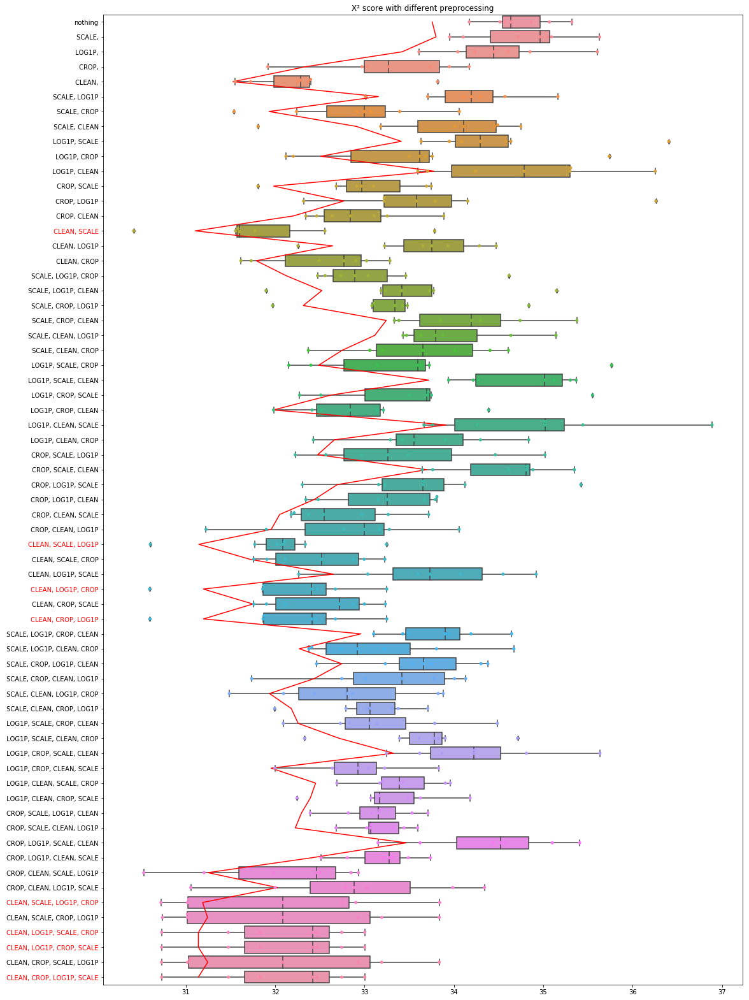

In [114]:
plt.figure(figsize=(18,28))
plt.title('X² score with different preprocessing')
ax = sns.boxplot(data=ddf, orient='h')
sns.swarmplot(data=ddf, orient='h')
plt.yticks(list(range(len(xi2s))), texts[:len(xi2s)], rotation='horizontal')
plt.plot(xi2s,list(range(len(xi2s))), c='r')

for ytick, color in zip(ax.get_yticklabels(), colors):
    ytick.set_color(color)

1